# **CZ1105 Dataset 5: How to do well as a seller?**

In [1]:
#basic library
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
import re
from IPython.display import display, HTML
sb.set()

# 1.How do we define a good seller?
- Definition 1: Sellers who get the most orders
- Definition 2: Sellers who earn the most revenue
- Definition 3: Sellers who get the best reviews

Fisrst, we use Definition 1 to do the analysis.



## 1.1 Needed files for seller analysis:
**File 5: olist_order_items_dataset.csv**\
**File 7: olist_order_review_dataset.csv**\
**File 10: olist_sellers_dataset.csv**

In [3]:
#File 5
items=pd.read_csv("olist_order_items_dataset.csv")

#File 7
reviewData = pd.read_csv('olist_order_reviews_dataset.csv')

#File 10
sellers=pd.read_csv("olist_sellers_dataset.csv")

items=items.drop_duplicates(['order_id'])

## 1.2 Definition 1: Analysis of Order Numbers for sellers

<AxesSubplot:ylabel='Count'>

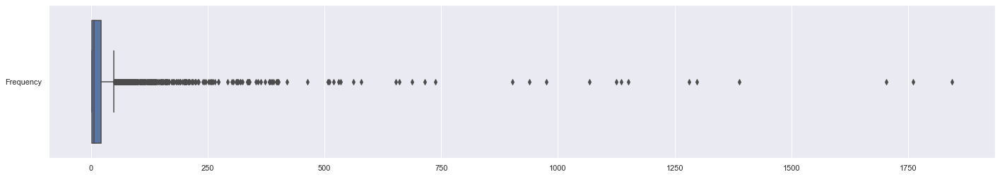

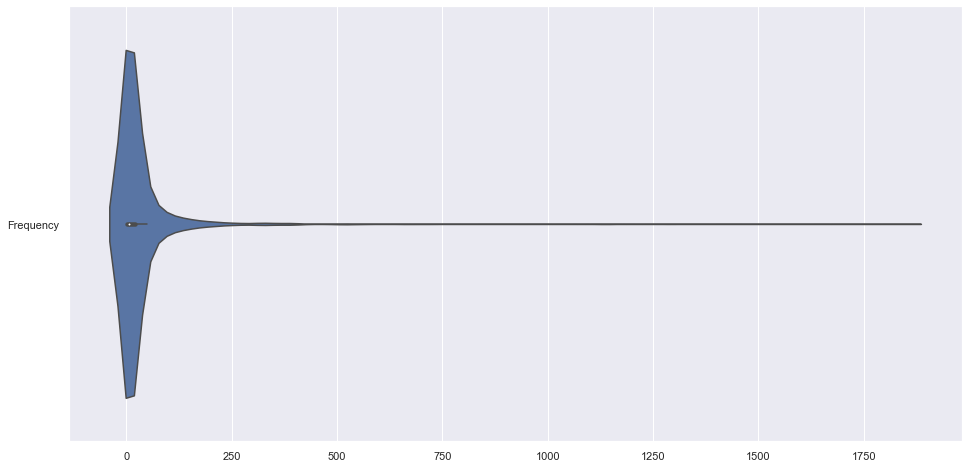

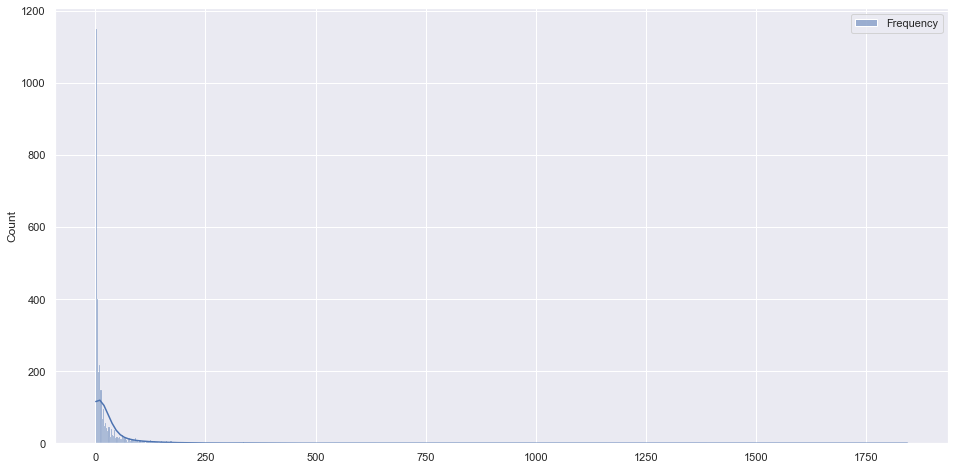

In [4]:
seller_freq_df=items.groupby(['seller_id']).size().reset_index(name='Frequency')

f = plt.figure(figsize=(24, 4))
sb.boxplot(data=seller_freq_df, orient='h')
f = plt.figure(figsize=(16, 8))
sb.violinplot(data=seller_freq_df, orient='h')
f = plt.figure(figsize=(16, 8))
sb.histplot(data=seller_freq_df, kde=True)

We can see from the violin graph that the distribution of data is similar to gaussian distribution. We then want to check if it is really gaussian distribution.
\
Here, a popular plot for checking the distribution of a data sample is the quantile-quantile plot, Q-Q plot, or QQ plot for short.
\
This plot can generate its own sample of Gaussian distribution that we are comparing with. The idealized samples are divided into groups, called quantiles. Each data point in the sample is paired with a similar member from the idealized distribution at the same cumulative distribution.
\
The resulting points are plotted as a scatter plot with the idealized value on the x-axis and the data sample on the y-axis.

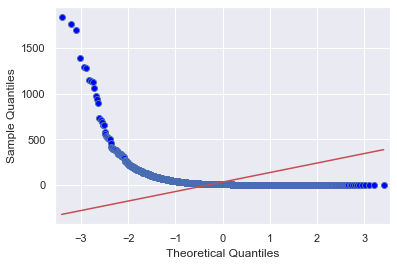

In [5]:
seller_orders_df=seller_freq_df.set_index('seller_id').sort_values('Frequency',ascending=False)
# QQ Plot
from numpy.random import seed
from numpy.random import randn
from statsmodels.graphics.gofplots import qqplot
from matplotlib import pyplot
# seed the random number generator
seed(1)
# generate univariate observations
data = 5 * randn(100) + 50
# q-q plot
qqplot(seller_orders_df, line='s')
pyplot.show()

A perfect match for the distribution will be shown by a line of dots on a 45-degree angle from the bottom left of the plot to the top right. Deviations by the dots from the line shows a deviation from the expected distribution. 
\
From the above graph, we can see that the data of `seller_received_orders` does not fit normal distribution. 
\
We perform further analysis on the data using the `describe()` method.

In [6]:
seller_orders_df.describe()

,Frequency
count,3088.000000
mean,31.951425
std,104.093665
min,1.000000
25%,2.000000
50%,6.000000
75%,21.000000
max,1844.000000


We can see from the describe that **75%** of the sellers recieve less than **24** orders, while the best sellers can get as high as **1844** orders. 
\
This indicates that becoming a good seller is hard and learning the secret of success sellers is important before entering the market.


We can also inspect the region of distribution by plotting pie charts

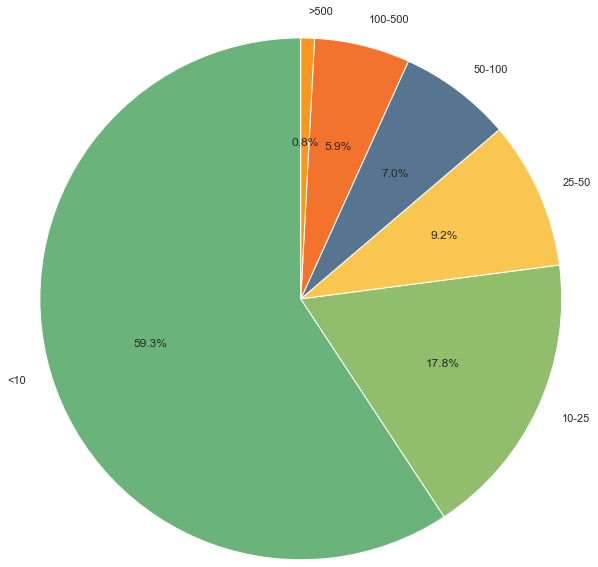

In [7]:
region=['<10','10-25','25-50','50-100','100-500','>500']
region_num=[0,0,0,0,0,0]
for index,row in seller_freq_df.iterrows():
  if row['Frequency']<10:
    region_num[0]+=1
  elif row['Frequency']<25:
    region_num[1]+=1
  elif row['Frequency']<50:
    region_num[2]+=1
  elif row['Frequency']<100:
    region_num[3]+=1
  elif row['Frequency']<500:
    region_num[4]+=1
  else:
    region_num[5]+=1

mycolors={"#F3722C","#F8961E","#F9C74F","#90BE6D","#6AB47C","#577590"} #Rainbow Colour
plt.pie(region_num, startangle=90, radius=3, labels=region, colors=mycolors, autopct='%1.1f%%')
plt.show()

From the pie chart, we can see that the orders received by each seller is not evenly distributed. **80%** of the sellers can only get under **25** orders while the top **0.9%** of the seller get over **500** orders.
## Next, we use the order stats we just get to find out the top 10 sellers receiving most orders.

In [8]:
print("The top 20 sellers to receive most orders:\n")
seller_orders_df.reset_index(inplace=True)
seller_orders_df=seller_orders_df.rename(columns = {'index':'seller_id'})
seller_orders_df.head(20)

The top 20 sellers to receive most orders:



,seller_id,Frequency
0,6560211a19b47992c3666cc44a7e94c0,1844
1,4a3ca9315b744ce9f8e9374361493884,1760
2,cc419e0650a3c5ba77189a1882b7556a,1703
3,1f50f920176fa81dab994f9023523100,1389
4,da8622b14eb17ae2831f4ac5b9dab84a,1298
5,955fee9216a65b617aa5c0531780ce60,1281
6,7a67c85e85bb2ce8582c35f2203ad736,1150
7,ea8482cd71df3c1969d7b9473ff13abc,1136
8,4869f7a5dfa277a7dca6462dcf3b52b2,1125
9,3d871de0142ce09b7081e2b9d1733cb1,1068


## 1.3 Definition 2: Analysis of Revenue for sellers
Now we can use Definition 2 to see how much do the good sellers earn.\
Since we don't have the data for cost, we'll use revenue instead.

In [9]:
seller_id=items['seller_id']
prices=items['price']
order_item_id=items['order_item_id']
seller_p=pd.concat([seller_id, prices, order_item_id], axis = 1).reindex(seller_id.index)

df_revenue=seller_p.groupby(["seller_id"])["price"].sum().reset_index(name='total revenue')
sorted_revenue=df_revenue.sort_values(['total revenue'],ascending=False).reset_index(drop=True)
print("The top 10 sellers to earn the most revenue:\n")
sorted_revenue.head(10)

The top 10 sellers to earn the most revenue:



,seller_id,total revenue
0,4869f7a5dfa277a7dca6462dcf3b52b2,224336.15
1,53243585a1d6dc2643021fd1853d8905,208199.61
2,fa1c13f2614d7b5c4749cbc52fecda94,192480.93
3,4a3ca9315b744ce9f8e9374361493884,179367.77
4,7e93a43ef30c4f03f38b393420bc753a,174958.93
5,7a67c85e85bb2ce8582c35f2203ad736,139450.74
6,7c67e1448b00f6e969d365cea6b010ab,138471.28
7,da8622b14eb17ae2831f4ac5b9dab84a,132372.59
8,46dc3b2cc0980fb8ec44634e21d2718e,125040.39
9,955fee9216a65b617aa5c0531780ce60,116438.33


In [10]:
sorted_revenue.describe()

,total revenue
count,3088.000000
mean,4024.739738
std,12855.049101
min,3.500000
25%,189.987500
50%,743.650000
75%,3010.555000
max,224336.150000


We can see from the describe a similar case to order numbers by each seller, majority sellers make under **3280** dollars while the best sellers make over **200,000** dollars.\
Now we can plot the distribution of revenue for sellers.


<AxesSubplot:ylabel='Count'>

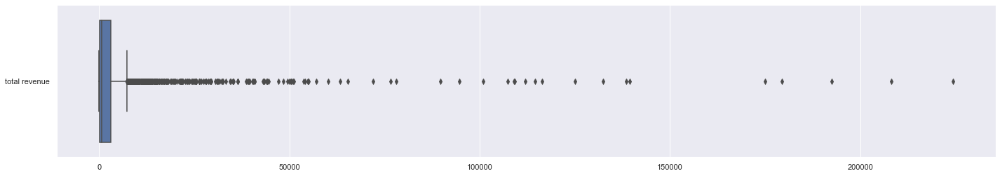

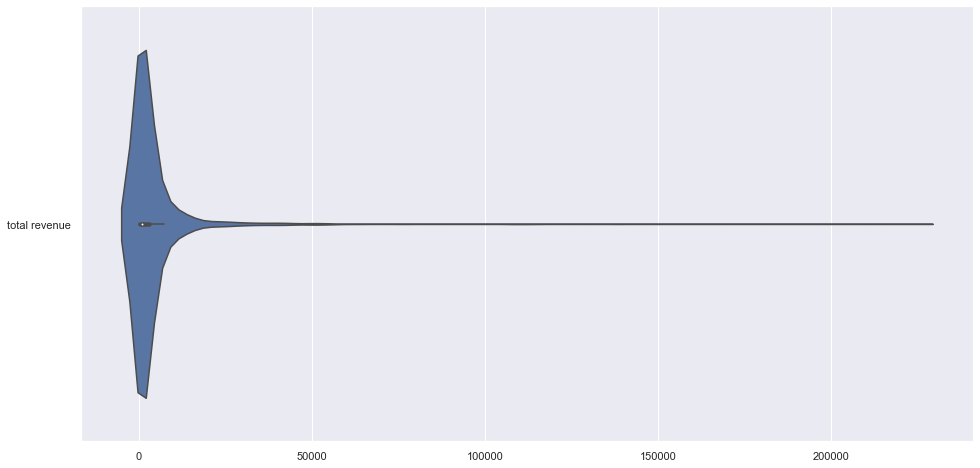

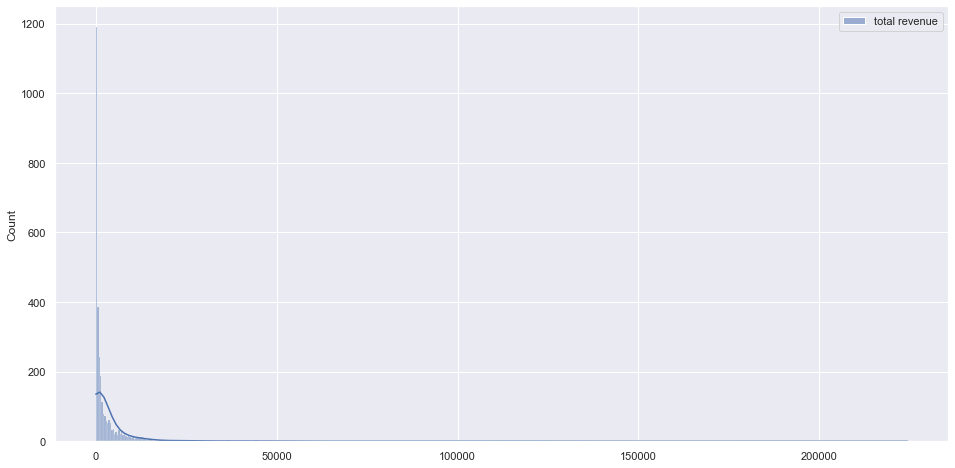

In [11]:
f = plt.figure(figsize=(24, 4))
sb.boxplot(data=df_revenue, orient='h')
f = plt.figure(figsize=(16, 8))
sb.violinplot(data=df_revenue, orient='h')
f = plt.figure(figsize=(16, 8))
sb.histplot(data=df_revenue, kde=True)

In these plot, we observed a similar distribution with the distribution of numbers of orders received by each buyer.

We can also use pie chart to further visualize our finding.

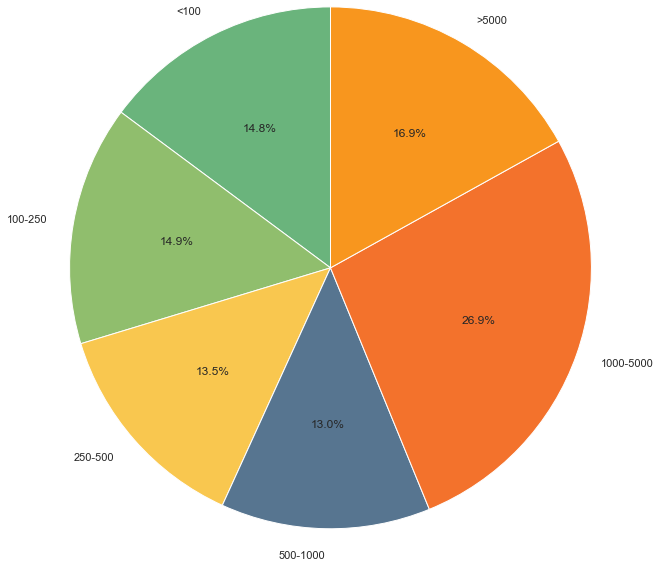

In [12]:
r_region=['<100','100-250','250-500','500-1000','1000-5000','>5000']
r_region_num=[0,0,0,0,0,0]
for index,row in sorted_revenue.iterrows():
  if row['total revenue']<100:
    r_region_num[0]+=1
  elif row['total revenue']<250:
    r_region_num[1]+=1
  elif row['total revenue']<500:
    r_region_num[2]+=1
  elif row['total revenue']<1000:
    r_region_num[3]+=1
  elif row['total revenue']<5000:
    r_region_num[4]+=1
  else:
    r_region_num[5]+=1

plt.pie(r_region_num, startangle=90, radius=3, labels=r_region, colors=mycolors, autopct='%1.1f%%')
plt.show()

## 1.4 Definition 3: Analysis of Reviews for sellers

In [13]:
reviewScore = reviewData.drop(columns = ['review_comment_title', 'review_comment_message', 'review_creation_date', 'review_answer_timestamp'])
reviewScore = reviewScore.merge(items[['order_id', 'product_id', 'seller_id', 'price']], 'left')
reviewScore = reviewScore.sort_values(by = 'review_score', ascending = True, axis = 0)
reviewScore = reviewScore.drop_duplicates(subset = ['review_id', 'order_id'])
display(reviewScore)

,review_id,order_id,review_score,product_id,seller_id,price
99999,efe49f1d6f951dd88b51e6ccd4cc548f,90531360ecb1eec2a1fbb265a0db0508,1,8fbd36d3b045f5f38b252b1513478f38,7e3f87d16fb353f408d467e74fbd8014,32.90
63169,f5c7bb41a0546fa40b1b451b8b49624d,1620c790cd0d6a55f4f5c3922764c96a,1,d97cfa719a6198d4a66453e0c6ed596c,e5a3438891c0bfdb9394643f95273d8e,34.30
32775,2f69718440672265f0d40604c33d06bb,43b2cd469a6cee268b9be121cbaf17ba,1,1f8aad0f80f6d061b4d09e538ad496d7,e883aa812c37a7413226856f4579fe91,59.90
18574,0564044dc84a8d26fdfedde8e041f98a,991dd93b0190239b4f3d41151e31d3ba,1,aa5e980b726d76e5a61dfd188724be28,5b67882648febfb6e1225e6ad7164f6b,499.99
63149,562640a8507c69bb5f99d26c440e0f4a,570a2d92be76532681e5a09ac38c8e78,1,327018136fd4a966408df8243383a233,6560211a19b47992c3666cc44a7e94c0,149.00
...,...,...,...,...,...,...
59590,d783a9fcdfa4e8f4b8e8bbe29cb73d3c,01fa35042136b75da24ce2a391b30eb9,5,aadff88486740e0b0ebe2be6c09476ae,da8622b14eb17ae2831f4ac5b9dab84a,29.90
32613,4d1afcf66f74b84ec2d803b745ba0d02,c8e348190c50484d7541f831a9fd75b2,5,c1b350ede922e02138912a3192bcc86d,5962468f885ea01a1b6a97a218797b0a,149.00
59592,5533516a1e784428f8db32a1914a8619,54623479e83b4d90c3a3087c34a95187,5,fed8c9425c38a8433368e5fa59592a89,7a67c85e85bb2ce8582c35f2203ad736,59.99
59580,e77a17ca0a7eca0962ff8dd8b80d3472,a4388d21a40d3fa0915cd15e2172eb45,5,4c2da344ea77566a0d45390f5cbd78e8,d91fb3b7d041e83b64a00a3edfb37e4f,108.00


distribution of review score 

<AxesSubplot:xlabel='Count', ylabel='review_score'>

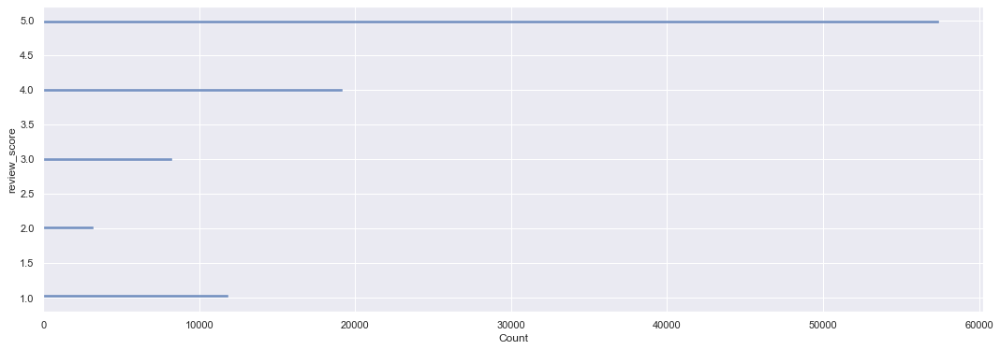

In [14]:
f = plt.figure(figsize=(18, 6))
sb.histplot(data = reviewScore, y = 'review_score')

Hypothesis: the higher the price, the lower the review

<AxesSubplot:xlabel='price', ylabel='review_score'>

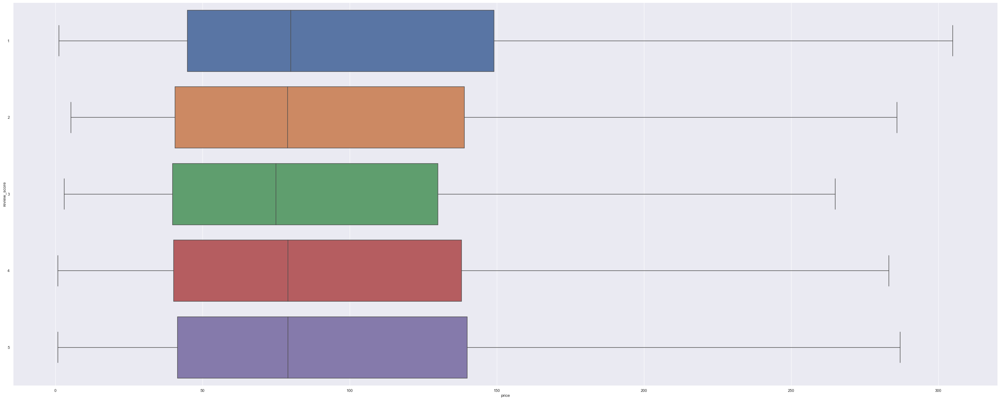

In [15]:
f = plt.figure(figsize=(50, 20))
sb.boxplot(data = reviewScore, y = 'review_score', x = 'price',  orient = "h", showfliers = False)

Conclusion:
Hypothesis is incorrect.
We need to find out another factor that results in the review scores to be so 

analysis for reviews of top sellers

In [16]:
reviewdict = {}
for index,row in reviewScore.iterrows():
    try:
        reviewdict[row['seller_id']][0]+=1
        reviewdict[row['seller_id']][1]+=row['review_score']
        if(row['review_score'] > 3):
            reviewdict[row['seller_id']][2]+=1
        
    except:
        reviewdict[row['seller_id']]=[1, row['review_score'], 0]
        if(row['review_score'] > 3):
            reviewdict[row['seller_id']][2]+=1
        

for values in reviewdict.values():
    try:
        values[1] = values[1]/values[0]
        values[2] = (values[2]/values[0])*100
    except:
        continue

In [17]:
seller_score_df=pd.DataFrame.from_dict(reviewdict, orient='index',columns=['number of sales','average_review', 'percentage of good review'])
seller_score_df.reset_index(inplace=True)
seller_score_df=seller_score_df.dropna()
top_seller_score_df=seller_score_df.sort_values('average_review',ascending=False).reset_index(drop=True)
top_seller_score_df=top_seller_score_df.rename(columns = {'index':'seller_id'})
top_seller_score_df.head(20)

,seller_id,number of sales,average_review,percentage of good review
0,d7f1cfc638473be93baedbfd02208016,1,5.0,100.0
1,804287717b9156fb7a787acd9af4fac1,1,5.0,100.0
2,fa5fdc4e4bb6bd1009ad0e4ac4096562,1,5.0,100.0
3,4ddeb3e828550cddc8d45c8bc36ab2d1,1,5.0,100.0
4,2d34636518ba88f5349b732fcf8ba2e4,1,5.0,100.0
5,83a75eea11694e36e56dd0cb2240229a,3,5.0,100.0
6,cb162c8eef257253782d245c08d9097c,1,5.0,100.0
7,6561d6bf844e464b4019442692b40e02,1,5.0,100.0
8,2b402d5dc42554061f8ea98d1916f148,1,5.0,100.0
9,4fe2f67634d00c021aa01f96b6f2d68e,2,5.0,100.0


Sellers with the best average score sell very little.
Let's look at the ones who has the highest sales instead

In [18]:
top_seller_num_df=seller_score_df.sort_values('number of sales',ascending=False).reset_index(drop=True)
top_seller_num_df=top_seller_num_df.rename(columns = {'index':'seller_id'})
top_seller_num_df.head(20)

,seller_id,number of sales,average_review,percentage of good review
0,6560211a19b47992c3666cc44a7e94c0,1850,3.929189,71.891892
1,4a3ca9315b744ce9f8e9374361493884,1776,3.834459,68.186937
2,cc419e0650a3c5ba77189a1882b7556a,1745,4.073352,75.644699
3,1f50f920176fa81dab994f9023523100,1394,4.137733,78.694405
4,da8622b14eb17ae2831f4ac5b9dab84a,1314,4.182648,79.452055
5,955fee9216a65b617aa5c0531780ce60,1283,4.149649,79.033515
6,7a67c85e85bb2ce8582c35f2203ad736,1153,4.247181,80.832611
7,ea8482cd71df3c1969d7b9473ff13abc,1137,4.001759,73.878628
8,4869f7a5dfa277a7dca6462dcf3b52b2,1125,4.136000,77.866667
9,3d871de0142ce09b7081e2b9d1733cb1,1069,4.146866,78.858746


Exact distribution of review score of the best seller 

In [19]:
top_sales_score = {1:0, 2:0, 3:0, 4:0, 5:0}
for index,row in reviewScore.iterrows():
    if row['seller_id'] == '6560211a19b47992c3666cc44a7e94c0':    
        top_sales_score[row['review_score']]+=1

top_sales_score_df = pd.DataFrame.from_dict(top_sales_score, orient = 'index', columns = ['count'])
top_sales_score_df.reset_index(inplace=True)
top_sales_score_df=top_sales_score_df.rename(columns = {'index':'review_score'})
display(top_sales_score_df)

,review_score,count
0,1,234
1,2,89
2,3,197
3,4,384
4,5,946


Let's visualise it as a pie chart

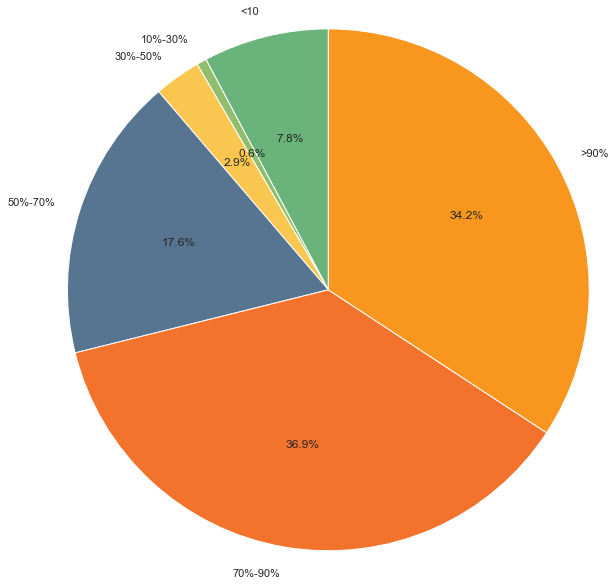

In [20]:
percentage = ['<10', '10%-30%','30%-50%', '50%-70%', '70%-90%', '>90%']
percentage_count = [0,0,0,0,0,0]
for index,row in top_seller_num_df.iterrows():
    if row['percentage of good review'] < 10:
        percentage_count[0] += 1
    elif 10 <= row['percentage of good review'] < 30:
        percentage_count[1] += 1
    elif 30 <= row['percentage of good review'] < 50:
        percentage_count[2] += 1
    elif 50 <= row['percentage of good review'] < 70:
        percentage_count[3] += 1
    elif 70 <= row['percentage of good review'] < 90:
        percentage_count[4] += 1
    else:
        percentage_count[5] += 1

plt.pie(percentage_count, startangle=90, radius=3, colors=mycolors, labels=percentage, autopct='%1.1f%%')
plt.show()

## What are the secrets of these good sellers? 
Let's find out the key factors to be a successful seller.\
Since reveue depends a lot on the product, we decide to use order numbers to determine a good seller.\
We mainly analysis product, geolocation, and review in the following sections.

# 2.Product Analysis



## 2.1 Needed files for product analysis:
**File 1: olist_closed_deals_dataset.csv**
1. What kind of product is more likely to be in a closed deal?
(find out what product not to choose)

**File 5: olist_order_items_dataset.csv**
1. What items are most ordered?
2. What are the features of these items? 
(price/category/promotion etc...)

**File 8: olist_orders_dataset.csv**
1. Get order time information to predict future sales for seller.

**File 9 & File 10: olist_products_dataset.csv & product_category_name_translation.csv**
(File 10 is the translation of File 9)
1. What category of product is most welcomed?
2. In which area would the competetion be fierce?

In [21]:
#Import all the files needed
#File 1
closed=pd.read_csv("olist_closed_deals_dataset.csv")

#File 9
products=pd.read_csv("olist_products_dataset.csv")

#File 10
translations=pd.read_csv("product_category_name_translation.csv")


## 2.2 What products does the good sellers sell?

In [22]:
def translate (name):
  translation=translations.loc[translations['product_category_name']==name]
  eng=translation['product_category_name_english']
  eng=eng.head(1).values[0]

  return eng
  

In [23]:
#Function for finding the english category of sellers
def cat_display (id):
  selling_product_ids=prod_seller.loc[prod_seller['seller_id']==id]
  product_id=selling_product_ids.drop_duplicates(subset=['product_id']).reset_index(drop=True)

  prod_cat={}
  for index, row in product_id.iterrows():
    product_info=prod_info.loc[prod_info['product_id']==row['product_id']]
    product_info=product_info['product_category_name']
    info_spain=product_info.head(1).values[0]
    info=translate(info_spain)
    
    try:
      prod_cat[info]+=1
    except:
      prod_cat[info]=1

  seller_cat=pd.DataFrame(list(prod_cat.items()),columns=['category','count'])
  seller_cat=seller_cat.sort_values(['count'],ascending=False).reset_index(drop=True)
  
  f = plt.figure(figsize=(16, 8))
  plt.bar(seller_cat['category'],seller_cat['count'])
  plt.title('Number of Products in Each Category for Seller '+id)
  plt.ylabel('Count')
  plt.xlabel('Category')
  plt.show()

  return seller_cat


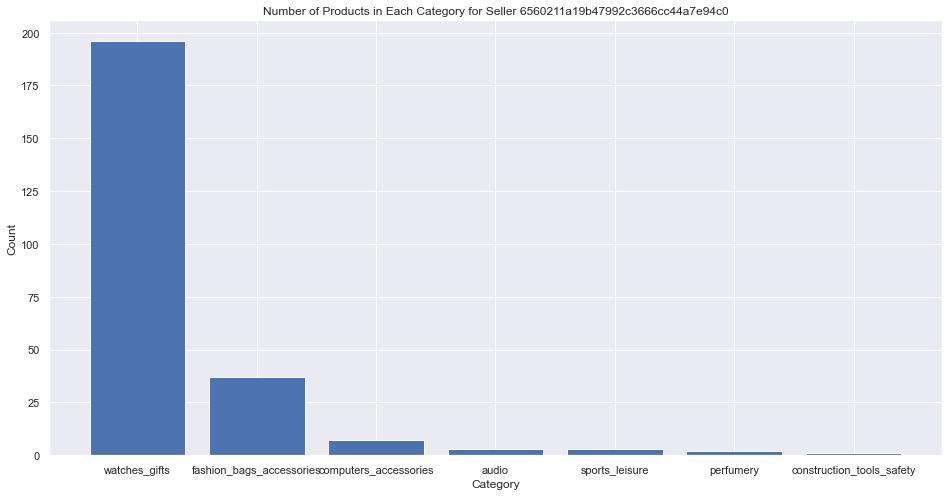

,category,count
0,watches_gifts,196
1,fashion_bags_accessories,37
2,computers_accessories,7
3,audio,3
4,sports_leisure,3
5,perfumery,2
6,construction_tools_safety,1


In [24]:
prod_seller=pd.DataFrame(items[["product_id", "seller_id"]])
prod_info=pd.DataFrame(products[["product_id", "product_category_name"]])
prod_seller=prod_seller.sort_values(['product_id'])

#Get the seller_id of the top 10 orders
i=0
best_sellers_id=['0']*10
for index, row in seller_orders_df.iterrows():
  best_sellers_id[i]=row['seller_id']
  i+=1;
  if i==10:
    break;

#Use the first seller as an example
cat_display(best_sellers_id[0])


From the example of the best seller, we can see that the category of the seller is limited to only 6, however, in its focused category, it provides over 200 kinds of products.\
We want to check if it's true for the rest of the good sellers.

Seller 2 Categories:


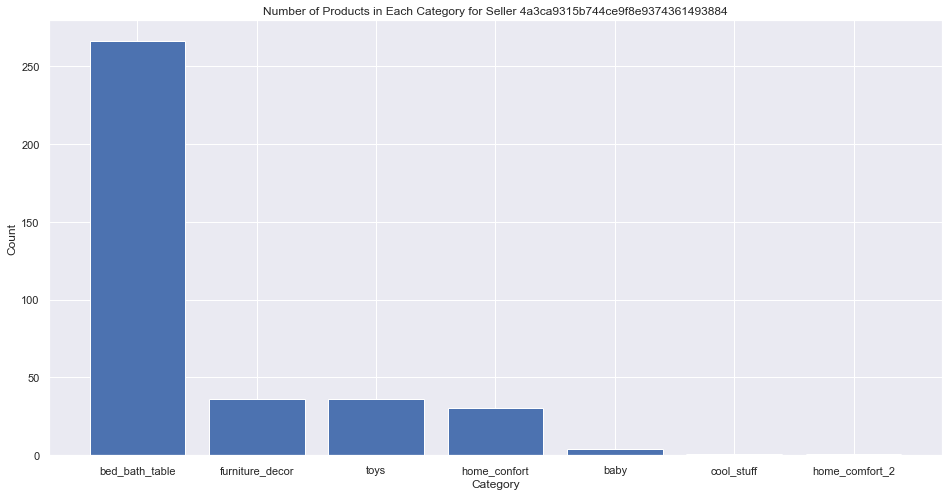




Seller 3 Categories:


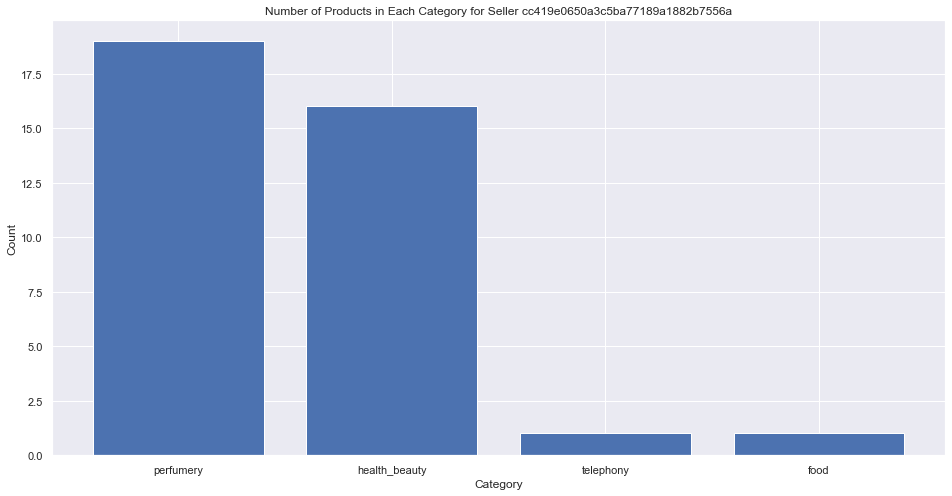




Seller 4 Categories:


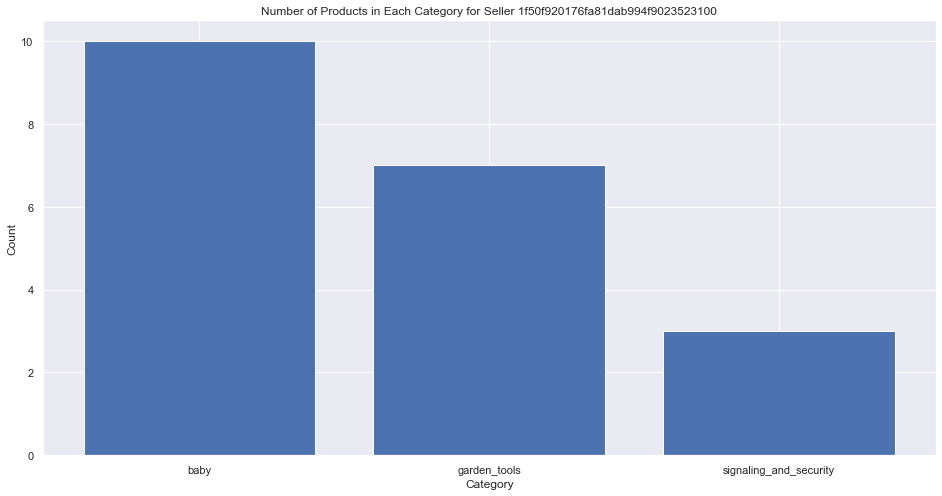




Seller 5 Categories:


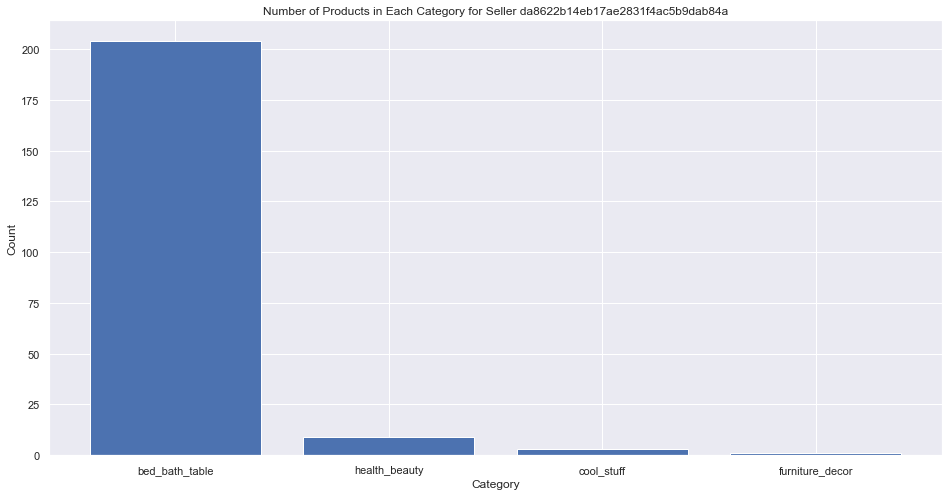




Seller 6 Categories:


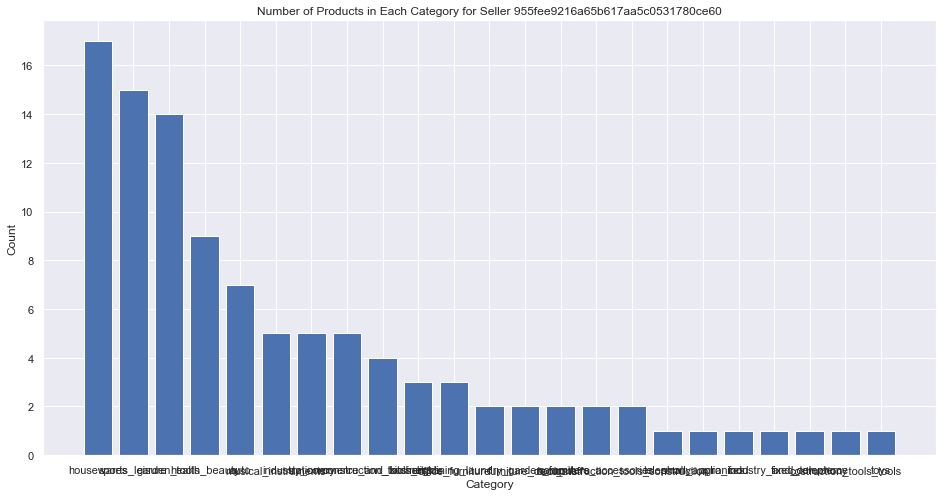




Seller 7 Categories:


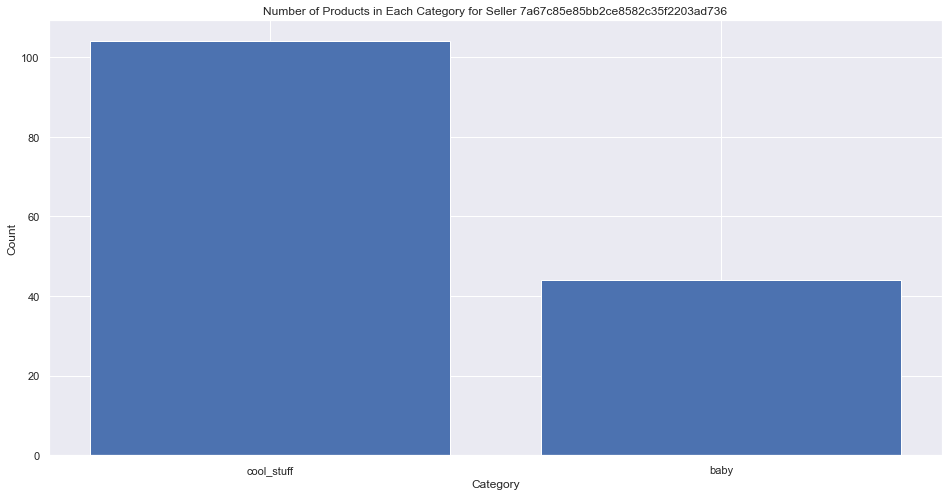




Seller 8 Categories:


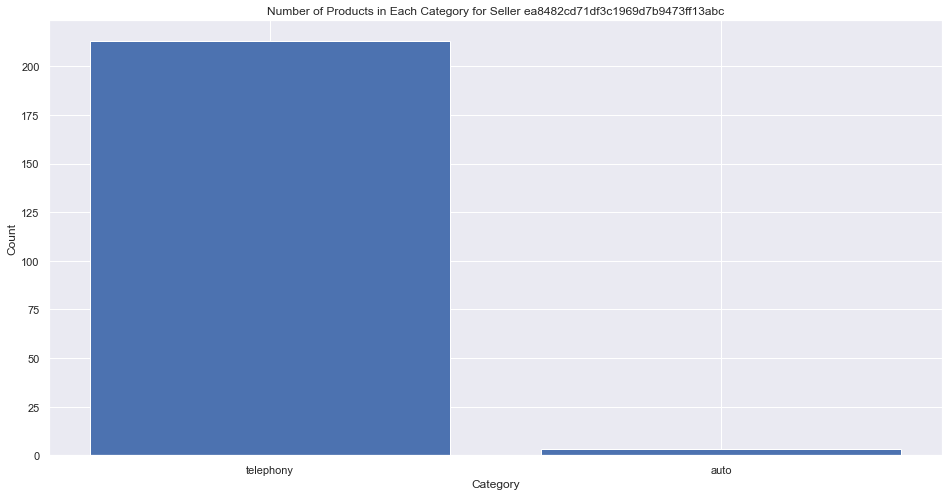




Seller 9 Categories:


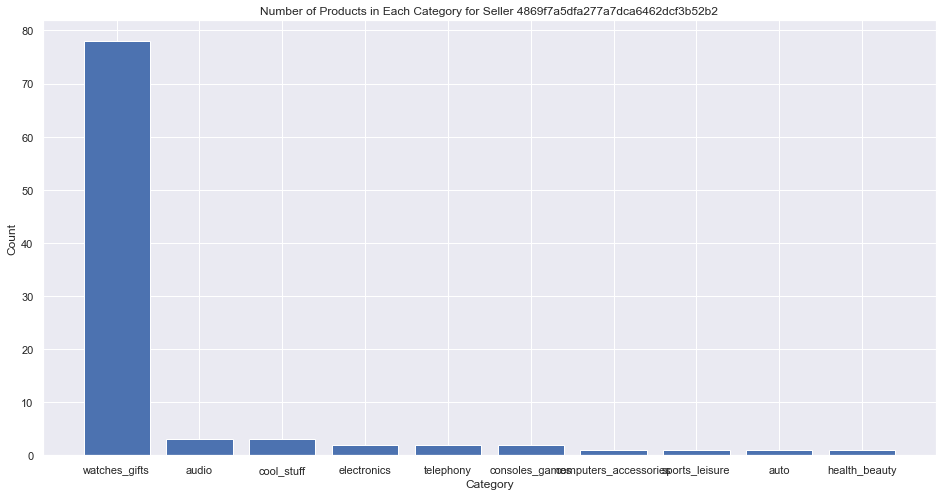




Seller 10 Categories:


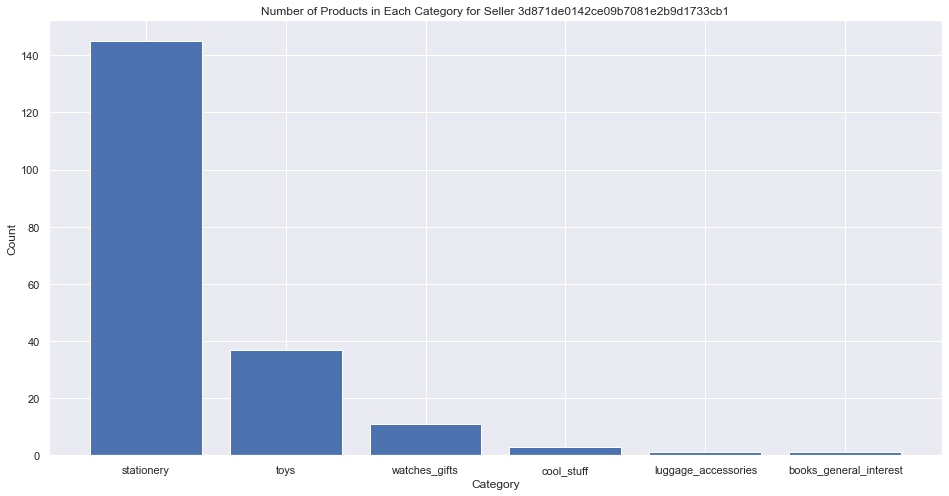

In [25]:
cat_seller=[]
for i in range(1,10):
    print("Seller", i+1, "Categories:")
    cat_seller.append(cat_display(best_sellers_id[i]))
    print("\n\n")


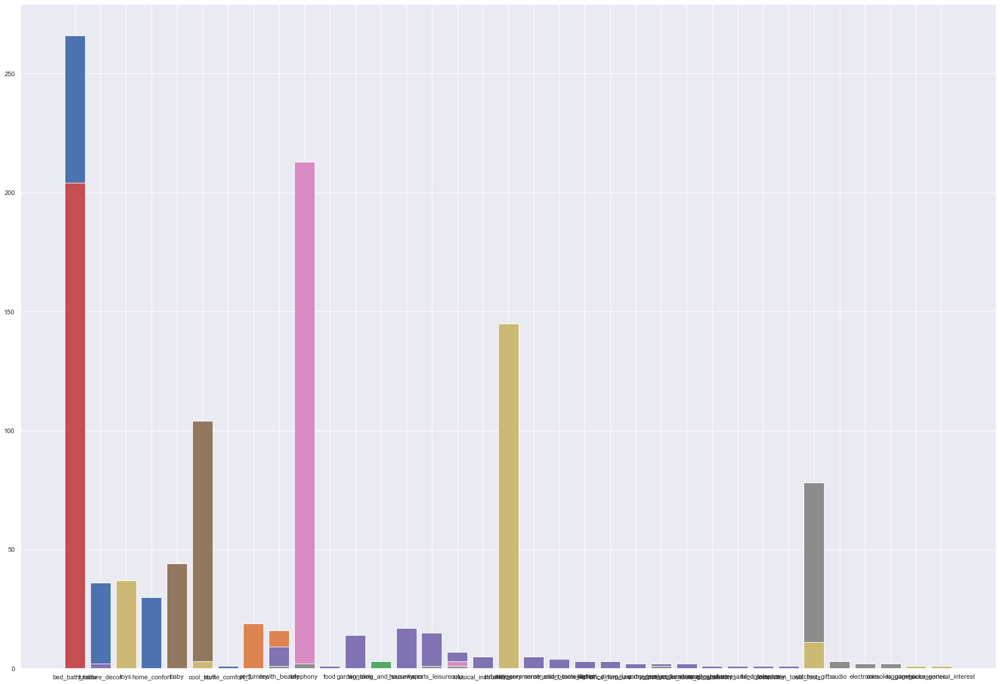

In [26]:
#General Distribution
fig = plt.subplots(figsize =(30, 21))
for i in range(9):
    plt.bar(cat_seller[i]['category'],cat_seller[i]['count'])

plt.show()

From the above analylsis, we can see that the good sellers are mostly focused in one or two category of products.\
The top 5 sellers are all doing business relating to family needs, like baby products, home furnitures, health_beauty and so on.\
On the other hand, electronics only appear in the 9th place sellers.\
This indicates that `Housewives` may be the majority customers of online shopping.
### To be a good seller, it is wise to consider in selling home-related products, fashion products, health_beauty products and so on.

## 2.3 How much are the sellers selling them at?
- First analysis the top 1 seller as an example

In [27]:
selling=items[['price','product_id','seller_id']]
best_seller_products=selling.loc[selling['seller_id']==best_sellers_id[0]]
best_seller_products=best_seller_products.drop_duplicates('product_id')
display(best_seller_products)

,price,product_id,seller_id
23,49.0,5d7c23067ed3fc8c6e699b9373d5890b,6560211a19b47992c3666cc44a7e94c0
117,49.0,5e21d5cab5d33e770d8150a4ee6117db,6560211a19b47992c3666cc44a7e94c0
148,75.0,7e6c4a0bf900e259f50ba63331fd2785,6560211a19b47992c3666cc44a7e94c0
175,29.0,02475368dfb38934fe55f574024fe1d7,6560211a19b47992c3666cc44a7e94c0
182,129.0,526f833e1eb0a32ad9351145a761b9ab,6560211a19b47992c3666cc44a7e94c0
...,...,...,...
101139,19.0,bc7f7a995ff963c23da53e0856e8b6a3,6560211a19b47992c3666cc44a7e94c0
101939,59.0,45dc67310ca176b5df98262187d7bf41,6560211a19b47992c3666cc44a7e94c0
103055,55.0,24820a1196d38b337b214cbe699410ed,6560211a19b47992c3666cc44a7e94c0
105442,50.0,90111fe8e74ecb8fb94fa93f76efbfe9,6560211a19b47992c3666cc44a7e94c0


We want to compare the best-seller's selling price with market average selling price.\
Next, we will compute market average price.

In [28]:
ordered_items=pd.DataFrame(items[["product_id", "order_item_id", "price"]])
itemdict={}
for index,row in ordered_items.iterrows():
  try:
    itemdict[row['product_id']][0]+=row['order_item_id']
    itemdict[row['product_id']][1]+=row['price']
  except:
    itemdict[row['product_id']]=[row['order_item_id'],row['price']]
    
for values in itemdict.values():
  try:
    values[1]=values[1]/values[0]
  except:
    continue

In [29]:
item_num_df=pd.DataFrame.from_dict(itemdict, orient='index',columns=['ordered_times','average_price'])
item_num_df.reset_index(inplace=True)
item_num_df=item_num_df.rename(columns = {'index':'product_id'})
item_num_df.head(15)

,product_id,ordered_times,average_price
0,4244733e06e7ecb4970a6e2683c13e61,8,59.275000
1,e5f2d52b802189ee658865ca93d83a8f,1,239.900000
2,c777355d18b72b67abbeef9df44fd0fd,2,199.000000
3,7634da152a4610f1595efa32f14722fc,2,12.990000
4,ac6c3623068f30de03045865e4e10089,12,202.400000
5,ef92defde845ab8450f9d70c526ef70f,5,21.900000
6,8d4f2bb7e93e6710a28f34fa83ee7d28,3,18.566667
7,557d850972a7d6f792fd18ae1400d9b6,1,810.000000
8,310ae3c140ff94b03219ad0adc3c778f,2,145.950000
9,4535b0e1091c278dfd193e5a1d63b39f,4,53.990000


In [30]:
def compare_price_display (seller_products):
  comparison={'larger':[0,0],
        'equal':[0,0],
        'smaller':[0,0],
        'total':[0,100]}

  for index, row in seller_products.iterrows():
    ave_price=item_num_df.loc[item_num_df['product_id']==row['product_id']]
    ave_price=ave_price['average_price'].head(1).values[0]
    comparison['total'][0]+=1
    if ave_price<row['price']:
      comparison['larger'][0]+=1
    elif ave_price>row['price']:
      comparison['smaller'][0]+=1
    else:
      comparison['equal'][0]+=1
  comparison['larger'][1]=comparison['larger'][0]/comparison['total'][0]*100
  comparison['smaller'][1]=comparison['smaller'][0]/comparison['total'][0]*100
  comparison['equal'][1]=comparison['equal'][0]/comparison['total'][0]*100
  
  comparison_df=pd.DataFrame.from_dict(comparison, orient='index', columns=['counts','percentage'])
  comparison_df.reset_index(inplace=True)
  comparison_df=comparison_df.rename(columns = {'index':'comparison'})
  
  f = plt.figure(figsize=(16, 8))
  plt.bar(comparison_df['comparison'],comparison_df['counts'])
  plt.title('Comparioson of selling price and market average price for Seller '+seller_products['seller_id'].head(1).values[0])
  plt.ylabel('Count')
  plt.xlabel('Comparison')
  plt.show()

  return comparison_df
  


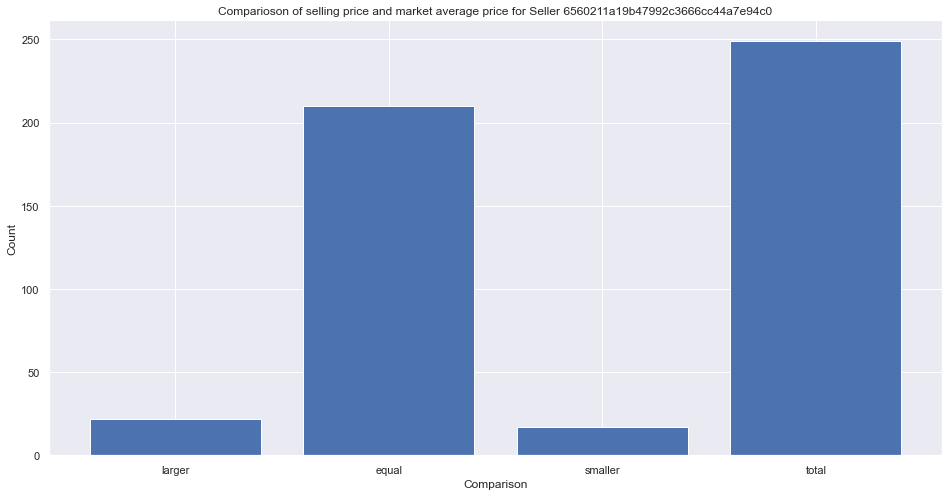

,comparison,counts,percentage
0,larger,22,8.835341
1,equal,210,84.337349
2,smaller,17,6.827309
3,total,249,100.000000


In [31]:
comparison=compare_price_display(best_seller_products)
display(comparison)


We can do similar operations for the other 9 sellers.

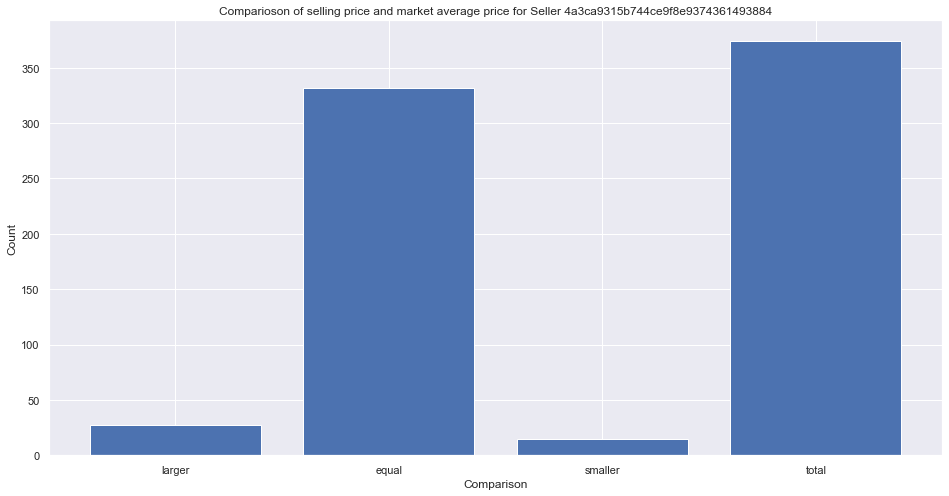

,comparison,counts,percentage
0,larger,27,7.219251
1,equal,332,88.770053
2,smaller,15,4.010695
3,total,374,100.000000


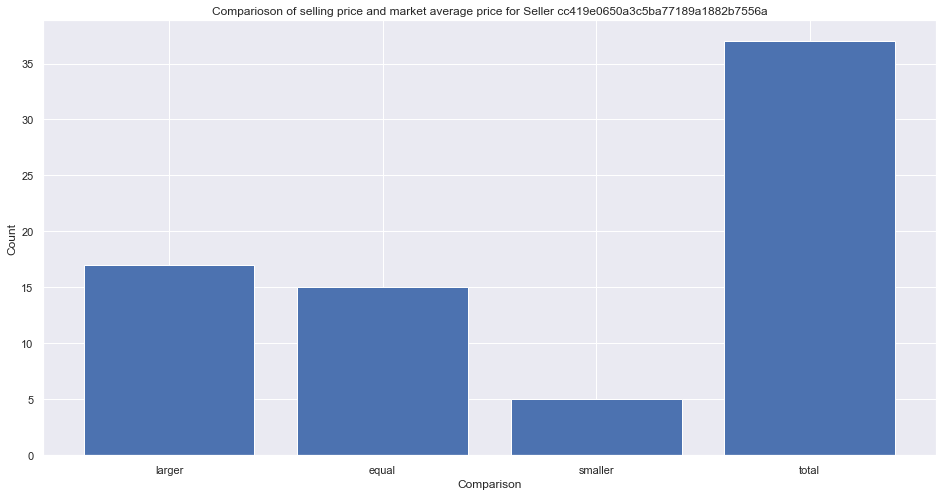

,comparison,counts,percentage
0,larger,17,45.945946
1,equal,15,40.540541
2,smaller,5,13.513514
3,total,37,100.000000


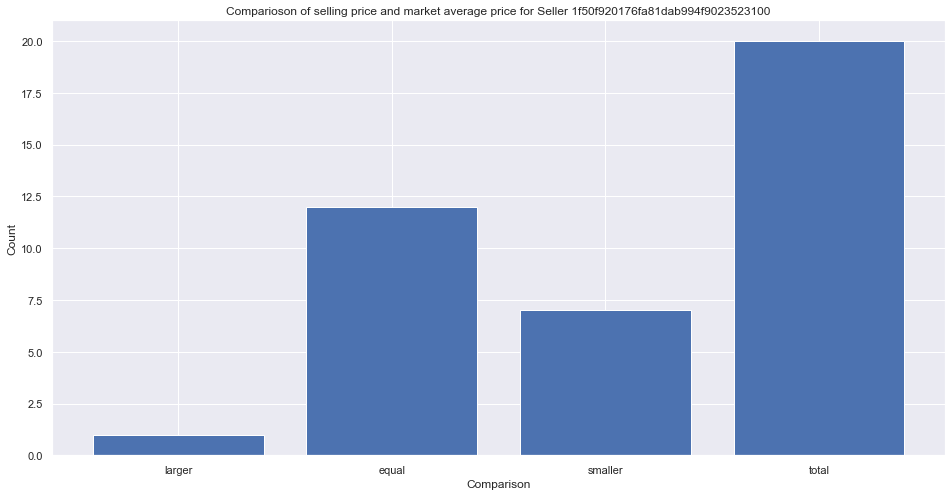

,comparison,counts,percentage
0,larger,1,5.0
1,equal,12,60.0
2,smaller,7,35.0
3,total,20,100.0


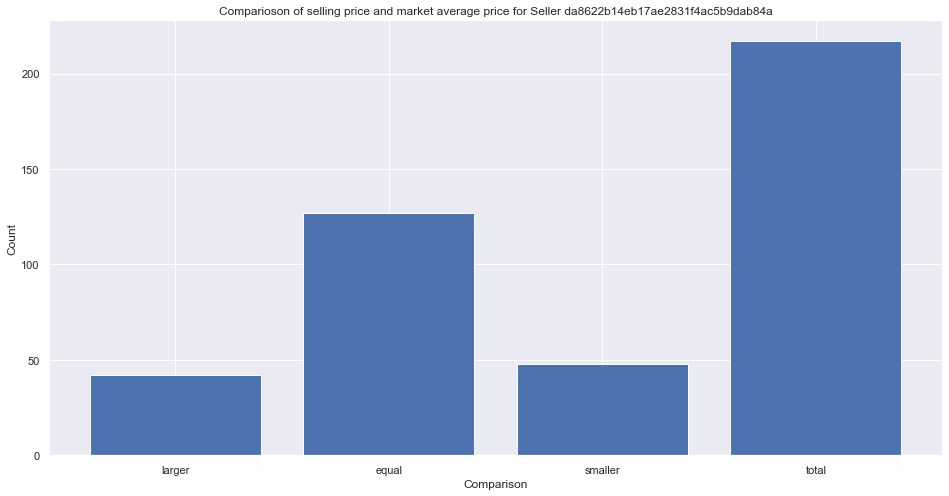

,comparison,counts,percentage
0,larger,42,19.354839
1,equal,127,58.525346
2,smaller,48,22.119816
3,total,217,100.000000


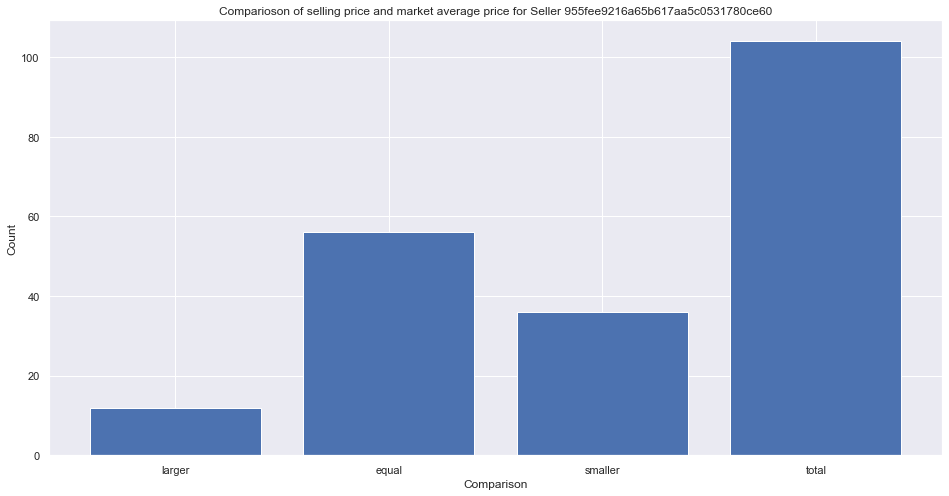

,comparison,counts,percentage
0,larger,12,11.538462
1,equal,56,53.846154
2,smaller,36,34.615385
3,total,104,100.000000


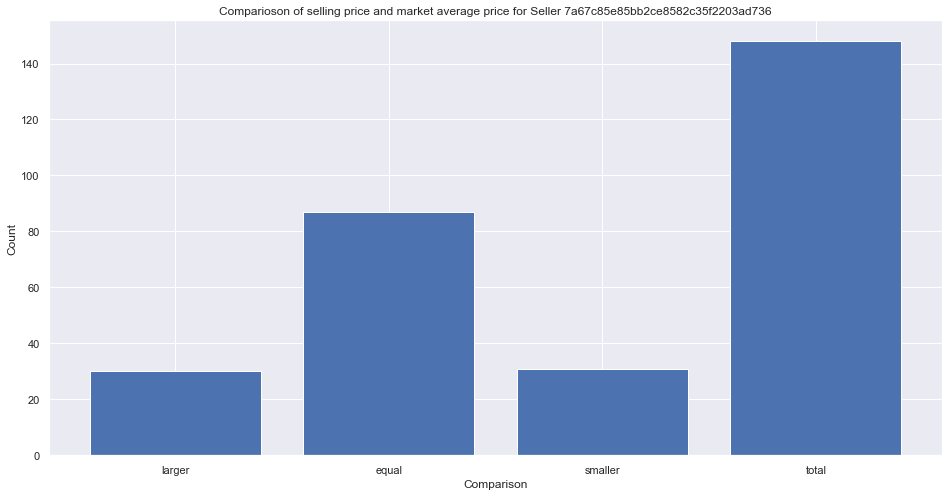

,comparison,counts,percentage
0,larger,30,20.270270
1,equal,87,58.783784
2,smaller,31,20.945946
3,total,148,100.000000


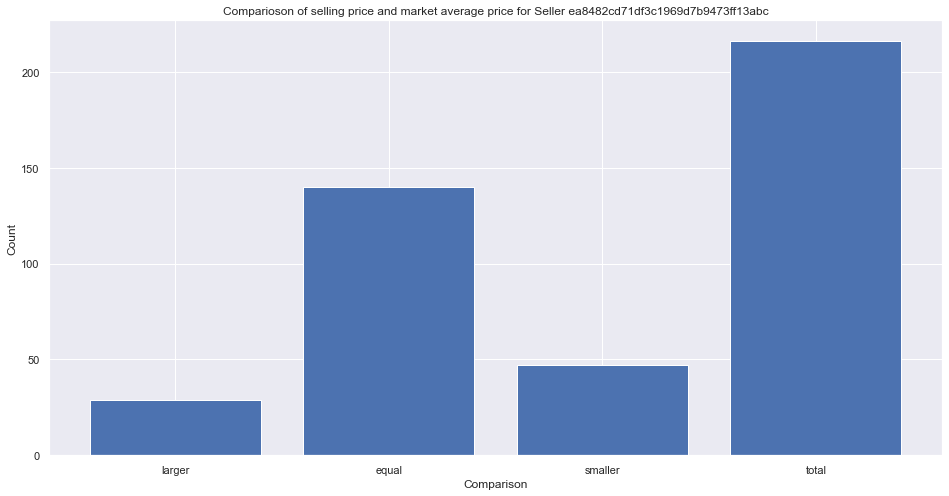

,comparison,counts,percentage
0,larger,29,13.425926
1,equal,140,64.814815
2,smaller,47,21.759259
3,total,216,100.000000


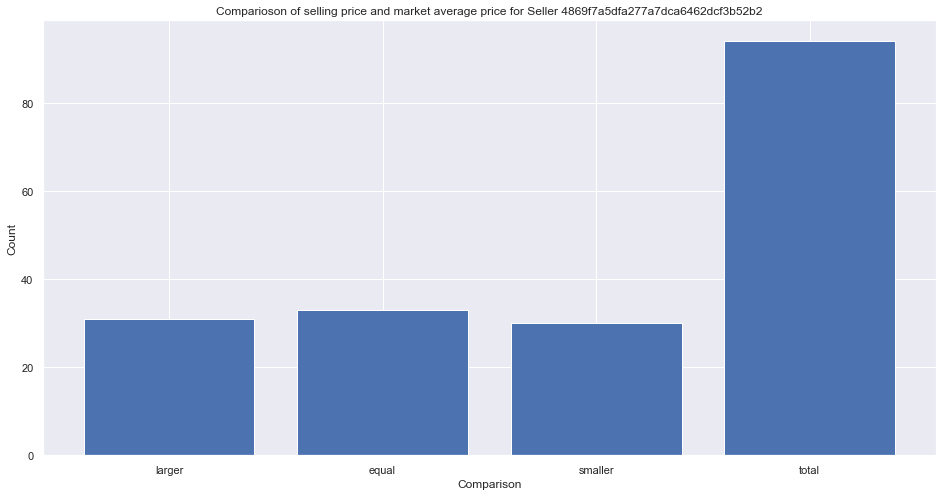

,comparison,counts,percentage
0,larger,31,32.978723
1,equal,33,35.106383
2,smaller,30,31.914894
3,total,94,100.000000


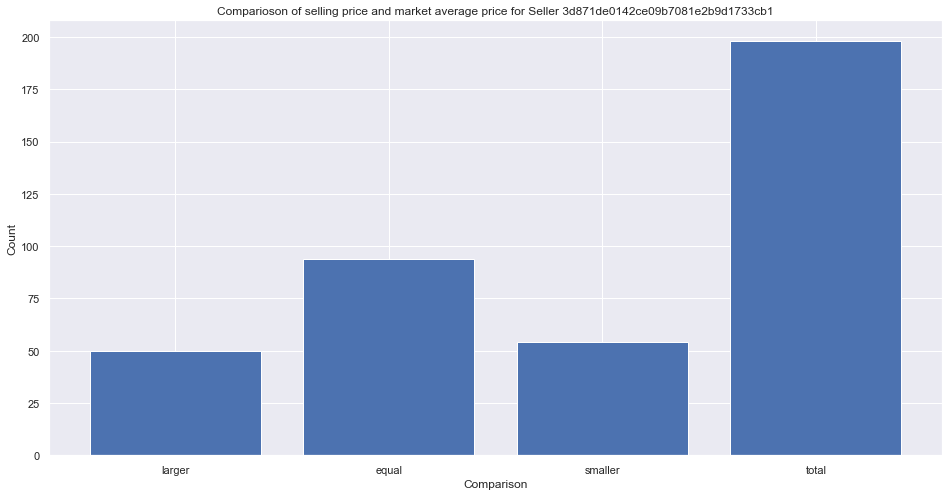

,comparison,counts,percentage
0,larger,50,25.252525
1,equal,94,47.474747
2,smaller,54,27.272727
3,total,198,100.000000


In [32]:
comparisons=[]
for i in range(1,10):
    best_seller_products=selling.loc[selling['seller_id']==best_sellers_id[i]]
    best_seller_products=best_seller_products.drop_duplicates('product_id')
    comparison=compare_price_display(best_seller_products)
    comparisons.append(comparison)
    display(comparison)

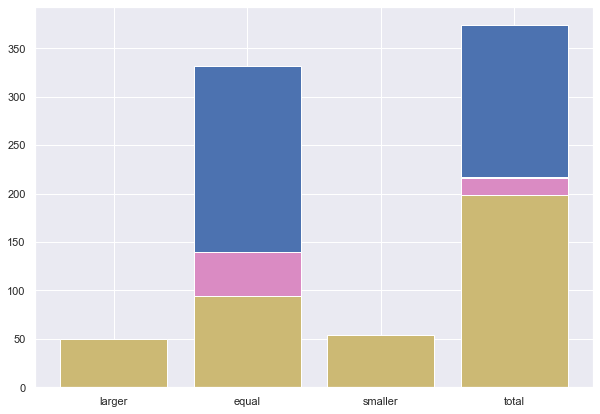

In [33]:
#General Distribution
fig = plt.subplots(figsize =(10, 7))
for i in range(9):
    plt.bar(comparisons[i]['comparison'],comparisons[i]['counts'])

plt.show()

We can see that for most sellers, they are selling the products in a equal or lower price. However, there is no clear indication whether all good sellers sell products cheaper. In fact, we can always see equal to market price triumphs others

## 2.4 Most Ordered Items

### 2.4.1 What are the most ordered items?



In [34]:
item_num_df=item_num_df.sort_values('ordered_times',ascending=False).reset_index(drop=True)
display(item_num_df)

,product_id,ordered_times,average_price
0,99a4788cb24856965c36a24e339b6058,439,88.180774
1,aca2eb7d00ea1a7b8ebd4e68314663af,429,71.307226
2,422879e10f46682990de24d770e7f83d,340,54.714382
3,d1c427060a0f73f6b889a5c7c61f2ac4,318,137.228365
4,53b36df67ebb7c41585e8d54d6772e08,302,116.301391
...,...,...,...
31876,aa670897230f03aba3286289219cf955,1,149.000000
31877,f79d8b06296298b788c13ecf27b9a9c1,1,142.900000
31878,5d20d66851c990b39754f6fe9b1376f4,1,39.000000
31879,3e878bb44e2c5b7fc755e304cc8236a4,1,9.990000


Since we have already sorted out the datas by its ordered times from above part, we can continue to use the sorted data.\
However, item information is not included.\
We will complete the item info next.

In [35]:
item_num_df=item_num_df.sort_values('product_id',ascending=False).reset_index(drop=True)
product=products.sort_values('product_id',ascending=False).reset_index(drop=True)
ordered_times=item_num_df['ordered_times']
ave=item_num_df['average_price']
product=product.join(ave)
product=product.join(ordered_times)
product=product.dropna(subset=['ordered_times'])
display(product)

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,average_price,ordered_times
0,fffe9eeff12fcbd74a2f2b007dde0c58,brinquedos,57.0,1536.0,3.0,3900.0,43.0,16.0,11.0,249.99,1.0
1,fffdb2d0ec8d6a61f0a0a0db3f25b441,informatica_acessorios,47.0,501.0,5.0,150.0,16.0,4.0,13.0,33.99,5.0
2,fff9553ac224cec9d15d49f5a263411f,fashion_bolsas_e_acessorios,22.0,328.0,3.0,150.0,16.0,13.0,11.0,32.00,1.0
3,fff81cc3158d2725c0655ab9ba0f712c,beleza_saude,54.0,643.0,1.0,58.0,16.0,16.0,11.0,90.00,1.0
4,fff6177642830a9a94a0f2cba5e476d1,cool_stuff,54.0,842.0,1.0,1400.0,42.0,25.0,15.0,114.99,2.0
...,...,...,...,...,...,...,...,...,...,...,...
31876,086f97beca2bb06567d542af191fa7a9,NaN,NaN,NaN,NaN,150.0,16.0,2.0,20.0,199.00,1.0
31877,086eff5dac22ac2fe1fed28bba4fa646,consoles_games,46.0,1594.0,3.0,1000.0,20.0,30.0,20.0,58.90,2.0
31878,086d5564c102e81c6f215639d9d1e09e,construcao_ferramentas_construcao,55.0,456.0,1.0,150.0,20.0,3.0,20.0,229.00,1.0
31879,086963be71b4f60fd2b27465c5a1fe7d,eletrodomesticos,58.0,1048.0,4.0,3600.0,30.0,11.0,55.0,129.90,1.0


Now we have a table containing all the information we need to analysis products, we can proceed to find out what make these products popular, and which factors affect sales.

### 2.4.2 What are the features of most ordered items?


#### 2.4.2.1 Analysis on data of type 'object'
- First, we look at the categry of products.
- We want to find out which category is ordered most times, which category has the most number of products, and which category does the best-sellers belong too respectively.

1. Which category is ordered most times?

In [36]:
types=product[['product_category_name','ordered_times']]
types.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31881 entries, 0 to 31880
Data columns (total 2 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   product_category_name  31290 non-null  object 
 1   ordered_times          31881 non-null  float64
dtypes: float64(1), object(1)
memory usage: 747.2+ KB


,product_category_name,ordered_times
0,sports_leisure,8742.0
1,furniture_decor,8502.0
2,bed_bath_table,8449.0
3,health_beauty,7126.0
4,housewares,6981.0
...,...,...
68,portateis_cozinha_e_preparadores_de_alimentos,15.0
69,home_comfort_2,9.0
70,pc_gamer,4.0
71,security_and_services,3.0


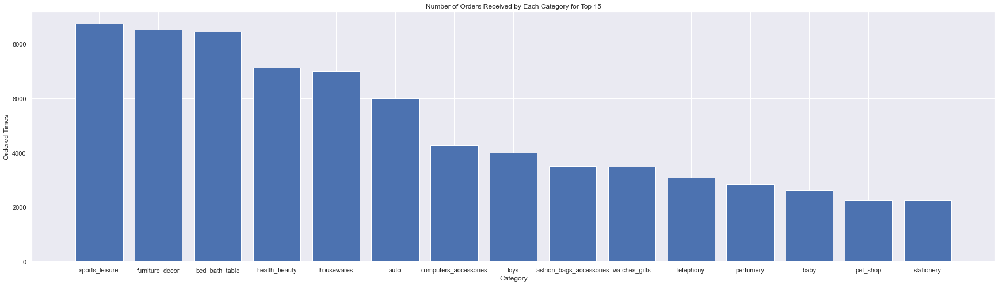

,product_category_name,ordered_times
0,sports_leisure,8742.0
1,furniture_decor,8502.0
2,bed_bath_table,8449.0
3,health_beauty,7126.0
4,housewares,6981.0
5,auto,5980.0
6,computers_accessories,4276.0
7,toys,3988.0
8,fashion_bags_accessories,3502.0
9,watches_gifts,3487.0


In [37]:
#from info, we find null value in category name
types=types.dropna(subset=['product_category_name'])
type_count=types.groupby(['product_category_name']).sum()
type_count=type_count.sort_values('ordered_times', ascending=False).reset_index()

cat_trans=type_count['product_category_name']
for index,row in type_count.iterrows():
  spain=cat_trans.head(len(type_count.index)).values[index]
  try:
    eng=translate(spain)
  except:
    continue
  type_count.at[index,'product_category_name']=eng

display(type_count)
f = plt.figure(figsize=(30, 8))
type_plot=type_count[0:15].copy()
plt.bar(type_plot['product_category_name'],type_plot['ordered_times'])
plt.title('Number of Orders Received by Each Category for Top 15')
plt.ylabel('Ordered Times')
plt.xlabel('Category')
plt.show()
type_count.head(15)

Upon displaying the orders each category received, we can also inspect the first 15 entries in the table to see the most welcomed categories.

2. Which category has the most number of product?

,product_category_name,product_number
0,bed_bath_table,2937
1,sports_leisure,2777
2,furniture_decor,2568
3,health_beauty,2375
4,housewares,2247
...,...,...
68,home_comfort_2,5
69,fashion_childrens_clothes,5
70,pc_gamer,2
71,security_and_services,2


,product_category_name,ordered_times
0,sports_leisure,8742.0
1,furniture_decor,8502.0
2,bed_bath_table,8449.0
3,health_beauty,7126.0
4,housewares,6981.0
...,...,...
68,portateis_cozinha_e_preparadores_de_alimentos,15.0
69,home_comfort_2,9.0
70,pc_gamer,4.0
71,security_and_services,3.0


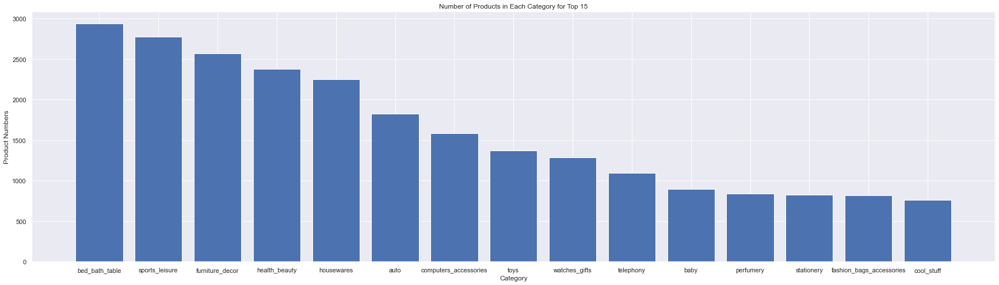

,product_category_name,product_number
0,bed_bath_table,2937
1,sports_leisure,2777
2,furniture_decor,2568
3,health_beauty,2375
4,housewares,2247
5,auto,1826
6,computers_accessories,1584
7,toys,1371
8,watches_gifts,1284
9,telephony,1097


In [38]:
num_prod=product[['product_id','product_category_name']].copy()
num_prod['product_number']=[1]*len(num_prod.index)
num_count=num_prod.groupby(['product_category_name']).sum()

num_count=num_count.sort_values('product_number', ascending=False).reset_index()
cat_trans=num_count['product_category_name']
for index,row in num_count.iterrows():
  spain=cat_trans.head(len(num_prod.index)).values[index]
  try:
    eng=translate(spain)
  except:
    continue
  num_count.at[index,'product_category_name']=eng

display(num_count)
display(type_count)
f=plt.figure(figsize=(30, 8))
num_plot=num_count[0:15].copy()
plt.bar(num_plot['product_category_name'],num_plot['product_number'])
plt.title('Number of Products in Each Category for Top 15')
plt.ylabel('Product Numbers')
plt.xlabel('Category')
plt.show()
num_count.head(15)

With similar operations, we can see tha the popular categories are the same, meaning that competition in these area would be fierce but profits are also attractive.

#### 2.4.2.2 Analysis on numeric data
- Secondly, we look at the numeric data
- Find correlation of the variables and ordered times.
- Find distribution of all variables

,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,average_price,ordered_times
product_name_lenght,1.000000,0.099402,0.134166,0.045640,0.081019,-0.015154,0.070245,-0.001055,-0.004419
product_description_lenght,0.099402,1.000000,0.109297,0.061455,0.035596,0.063363,-0.032016,0.007592,0.002123
product_photos_qty,0.134166,0.109297,1.000000,0.038359,0.067490,0.005314,0.026495,-0.005102,0.000853
product_weight_g,0.045640,0.061455,0.038359,1.000000,0.474886,0.564046,0.527787,-0.005873,-0.005825
product_length_cm,0.081019,0.035596,0.067490,0.474886,1.000000,0.204680,0.541122,0.001584,-0.003602
product_height_cm,-0.015154,0.063363,0.005314,0.564046,0.204680,1.000000,0.315579,0.003343,-0.006524
product_width_cm,0.070245,-0.032016,0.026495,0.527787,0.541122,0.315579,1.000000,0.001463,-0.004997
average_price,-0.001055,0.007592,-0.005102,-0.005873,0.001584,0.003343,0.001463,1.000000,-0.028156
ordered_times,-0.004419,0.002123,0.000853,-0.005825,-0.003602,-0.006524,-0.004997,-0.028156,1.000000


<AxesSubplot:>

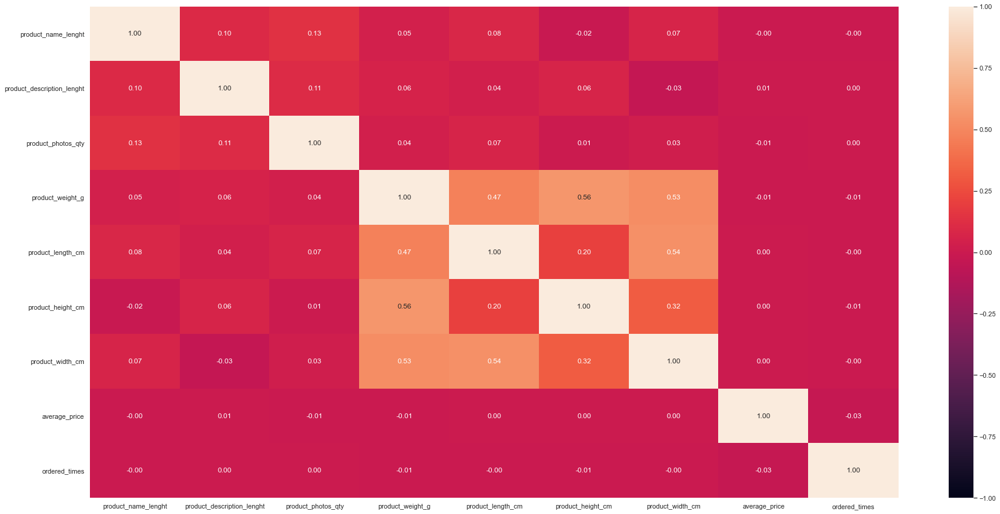

In [39]:
numeric_pro=product[['product_name_lenght','product_description_lenght','product_photos_qty',	
                     'product_weight_g','product_length_cm','product_height_cm','product_width_cm',
                     'average_price','ordered_times']]
display(numeric_pro.corr())
f=plt.figure(figsize=[30,15])
sb.heatmap(numeric_pro.corr(), vmin = -1, vmax = 1, annot = True, fmt=".2f")

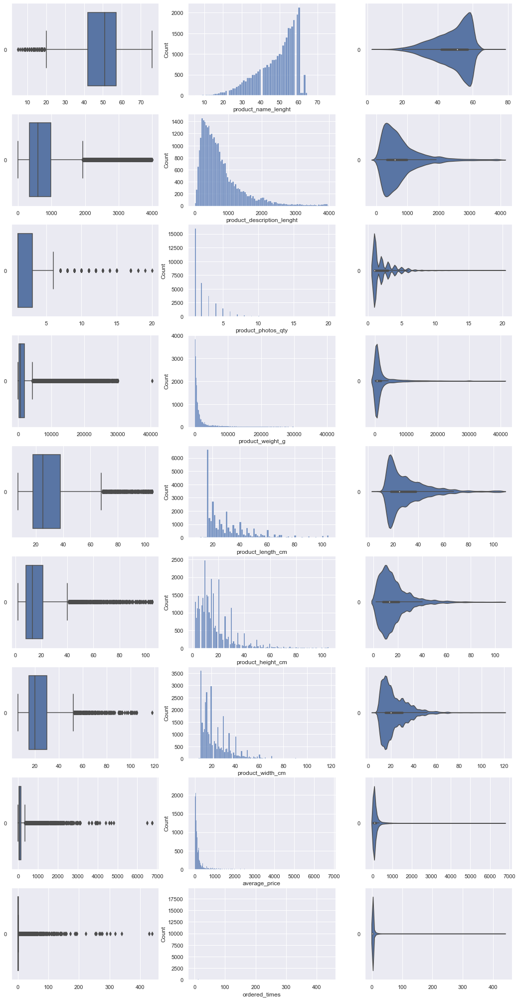

In [40]:
# Draw the distributions of all variables
f, axes = plt.subplots(9, 3, figsize=(18, 36))

count = 0
for var in numeric_pro:
    sb.boxplot(data = numeric_pro[var], orient = "h", ax = axes[count,0])
    sb.histplot(data = numeric_pro[var], ax = axes[count,1])
    sb.violinplot(data = numeric_pro[var], orient = "h", ax = axes[count,2])
    plt.xticks=var
    count += 1

The correlation between ordered times and other product information is still quite obscure. So we decided to narrow down the data scope and analysis the top 1000 products.

,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,average_price,ordered_times
product_name_lenght,1.000000,0.116428,0.168554,0.075438,0.150278,0.021226,0.099736,0.050449,-0.024799
product_description_lenght,0.116428,1.000000,0.111661,0.042663,0.017462,0.052279,-0.044197,-0.022151,-0.008755
product_photos_qty,0.168554,0.111661,1.000000,0.071138,0.054859,0.046662,0.059352,0.011624,-0.020794
product_weight_g,0.075438,0.042663,0.071138,1.000000,0.538101,0.532887,0.561358,-0.048265,-0.050755
product_length_cm,0.150278,0.017462,0.054859,0.538101,1.000000,0.217878,0.589199,-0.038125,-0.021241
product_height_cm,0.021226,0.052279,0.046662,0.532887,0.217878,1.000000,0.294487,-0.041813,-0.020128
product_width_cm,0.099736,-0.044197,0.059352,0.561358,0.589199,0.294487,1.000000,-0.066034,-0.024678
average_price,0.050449,-0.022151,0.011624,-0.048265,-0.038125,-0.041813,-0.066034,1.000000,-0.029769
ordered_times,-0.024799,-0.008755,-0.020794,-0.050755,-0.021241,-0.020128,-0.024678,-0.029769,1.000000


<AxesSubplot:>

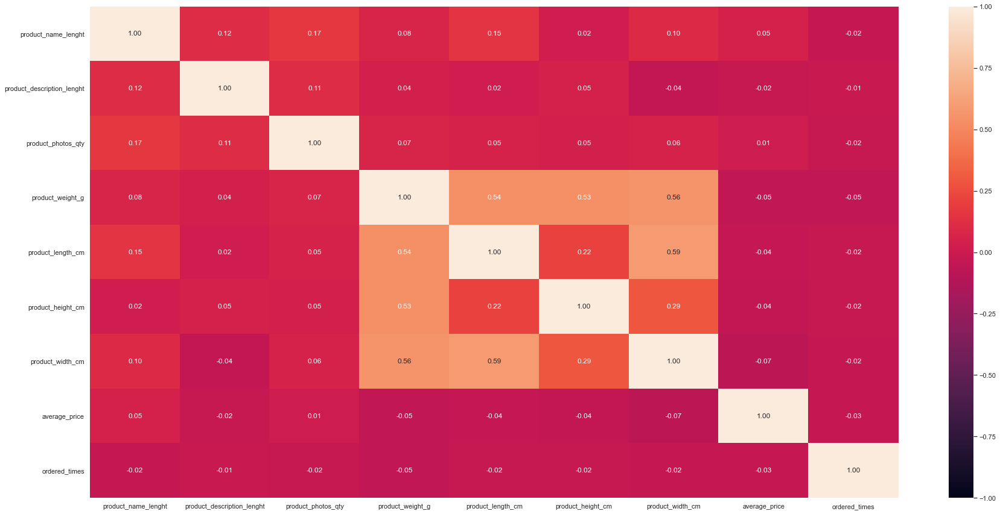

In [41]:
product_sorted=product.sort_values('ordered_times', ascending=False).reset_index(drop=True)
top1000=product_sorted[0:1000].copy()
display(top1000.corr())
f=plt.figure(figsize=[30,15])
sb.heatmap(top1000.corr(), vmin = -1, vmax = 1, annot = True, fmt=".2f")

The correlation is still not obvious from above data.\
Which means linear relationship between above factors and ordered times is unclear.\
We can next pick out the factors we are most interested in and plot the scatter plot, in order to get some inspiration.
\
From the first correlation we generate, price seems to be the factor that has a strongest correlation with ordered_times. We deceide to analysis it first.

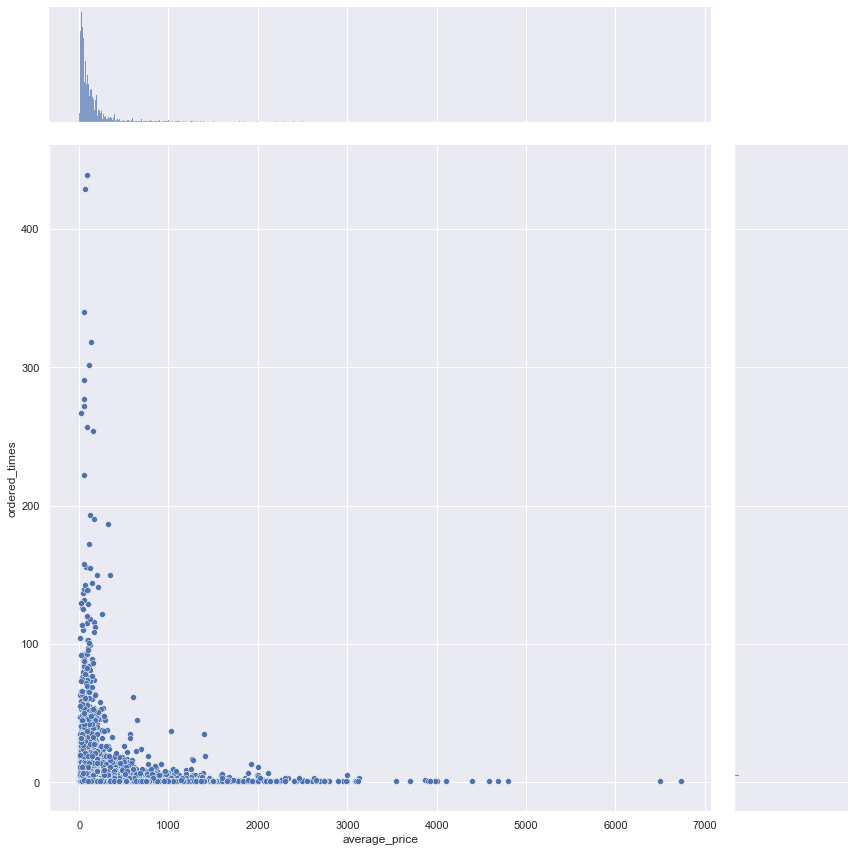

In [42]:
price=product['average_price']
times=product['ordered_times']
jointDF=pd.concat([price, times], axis = 1).reindex(price.index)
sb.jointplot(data = jointDF, x = "average_price", y = "ordered_times", height = 12)

Though the fitting is still unclear, we can see from near_axis areas that best-selling products are all near y-axis, which means low price.\
Areas near x-axis is also filled with points, which means expensive products generally doesn't sell much.
\


##### 2.4.2.2.1Analysis on single product
Since correlatios is not obvious for over all product, we can pick out the most_ordered products and see how these factors affect its sales.

In [43]:
order_by_sales=item_num_df.sort_values('ordered_times', ascending=False).reset_index(drop=True).copy()
most_item_id=order_by_sales.iloc[:100,]
display(most_item_id)

,product_id,ordered_times,average_price
0,99a4788cb24856965c36a24e339b6058,439,88.180774
1,aca2eb7d00ea1a7b8ebd4e68314663af,429,71.307226
2,422879e10f46682990de24d770e7f83d,340,54.714382
3,d1c427060a0f73f6b889a5c7c61f2ac4,318,137.228365
4,53b36df67ebb7c41585e8d54d6772e08,302,116.301391
...,...,...,...
95,7e0dc102074f8285580c9777f79c90cf,64,35.993750
96,dab2413ead0edda9967edbc9bda2a64e,64,29.983281
97,24c66f106f642621e524291a895c9032,63,181.328571
98,ab1f9387c0627dd24000bfbc54fdeee0,63,12.962540


First choose the item being ordered most times

Text(0.5, 1.0, 'Price')

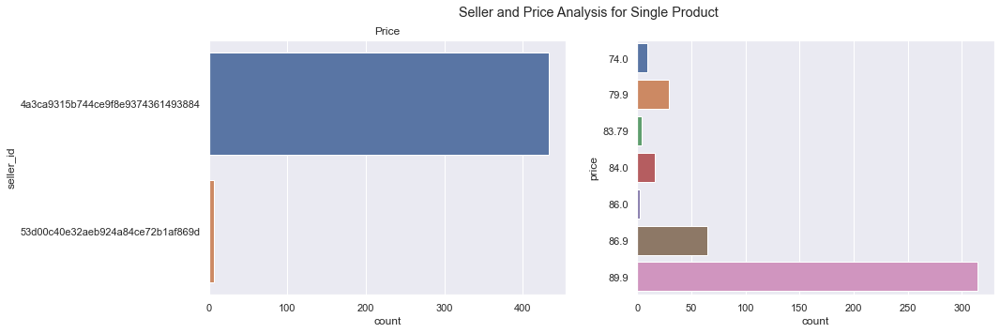

In [44]:
most_item_info=items.loc[items['product_id']==most_item_id['product_id'][0]]

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Seller and Price Analysis for Single Product')

sb.countplot(y="seller_id", data=most_item_info, ax=axes[0])
axes[0].set_title('Seller')
sb.countplot(y="price", data=most_item_info, ax=axes[1])
axes[0].set_title('Price')

We can see that even for single product, lower price doesn't necessarily mean more buyers, and most products are sell by the same seller.\
We can verify if it is true for the next 9 best_sellers.

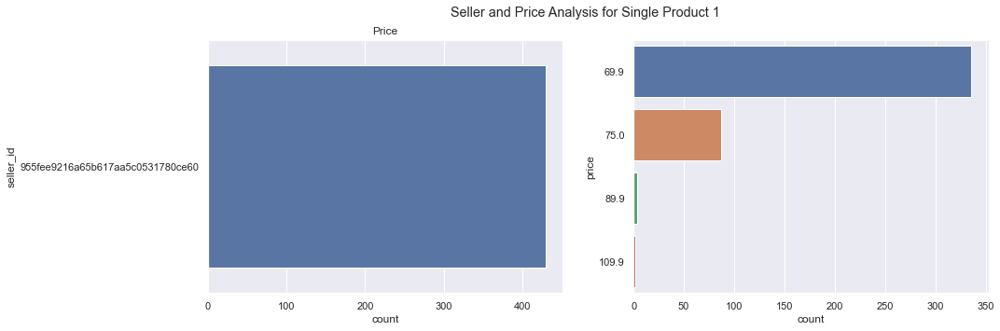

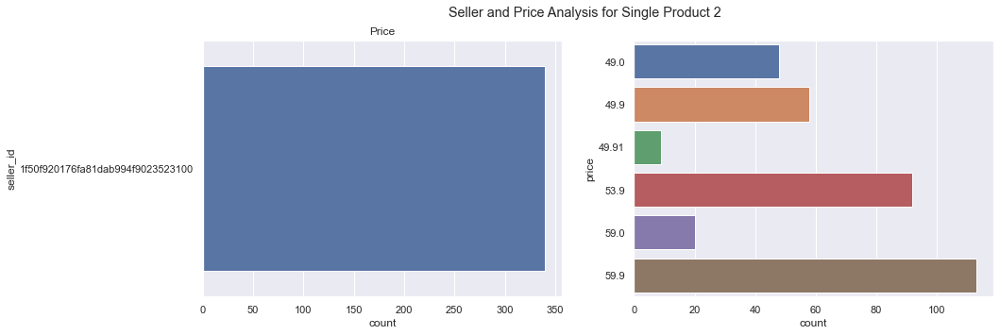

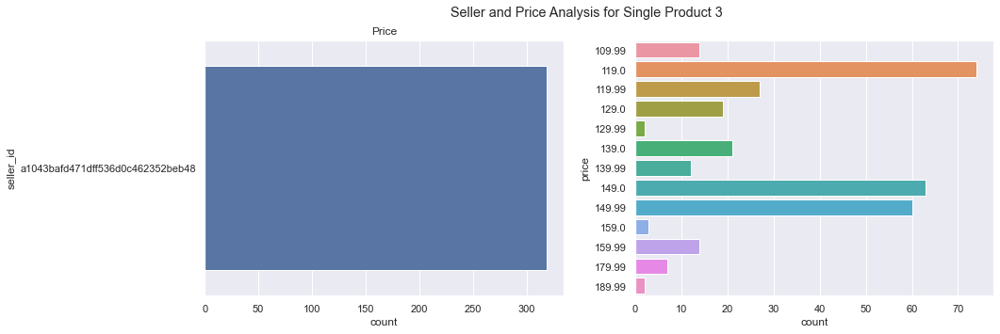

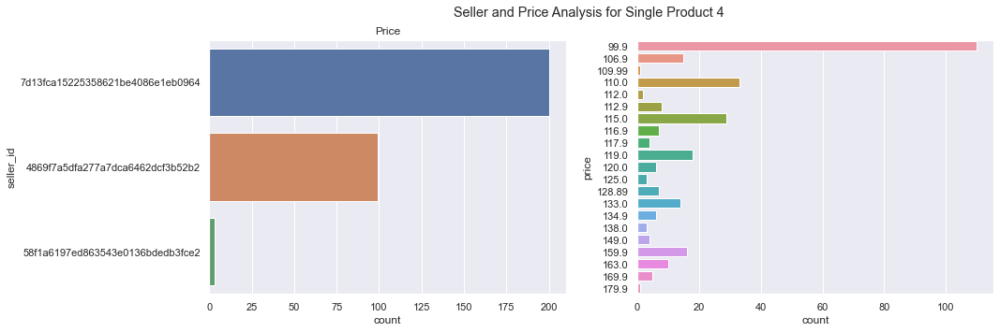

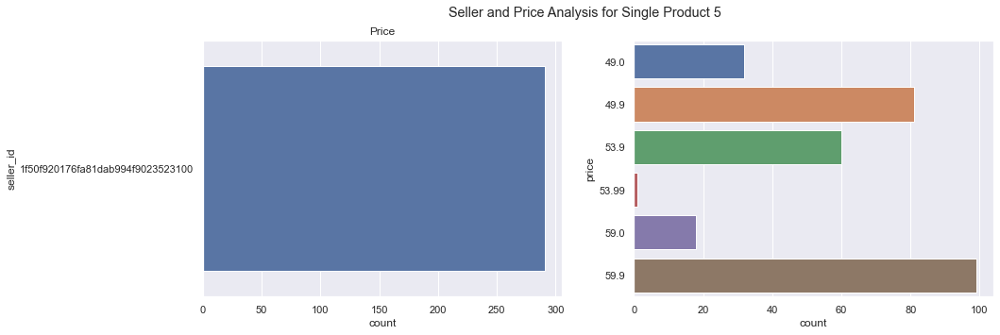

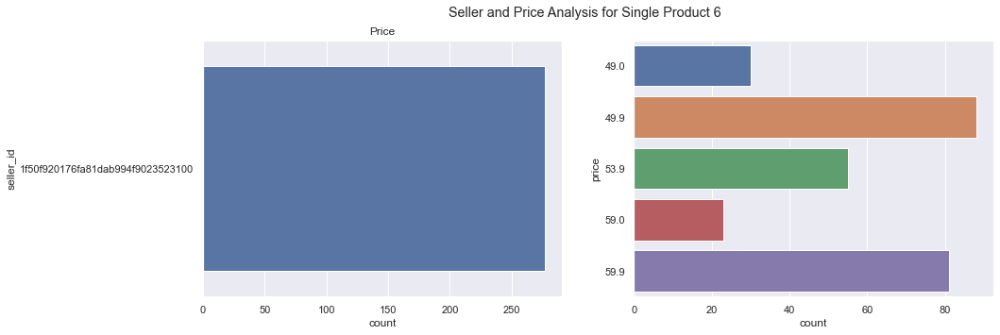

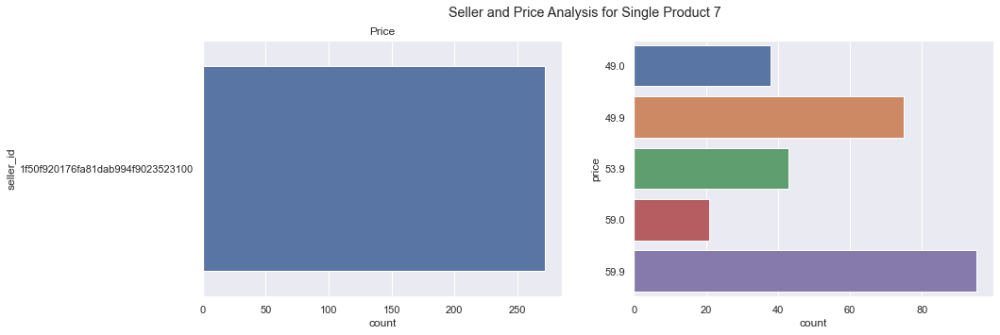

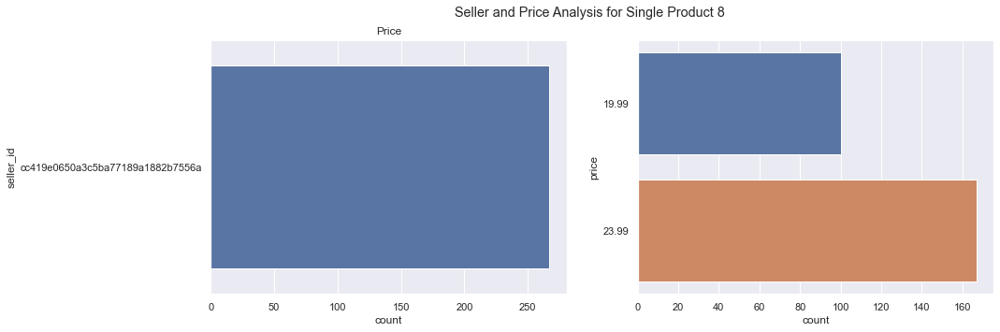

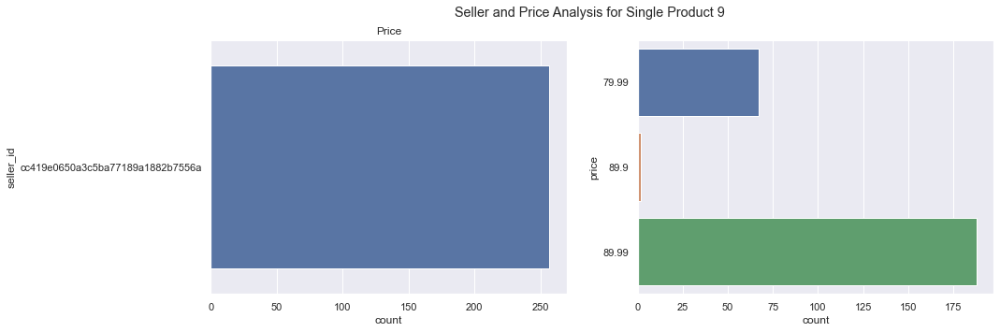

In [45]:
for i in range(1,10):
  most_item_info=items.loc[items['product_id']==most_item_id['product_id'][i]]
  fig, axes = plt.subplots(1, 2, figsize=(15, 5))
  fig.suptitle('Seller and Price Analysis for Single Product '+str(i))

  sb.countplot(y="seller_id", data=most_item_info, ax=axes[0])
  axes[0].set_title('Seller')
  sb.countplot(y="price", data=most_item_info, ax=axes[1])
  axes[0].set_title('Price')

##### 2.4.2.2.2 Analysis on Single Seller
Since we have the order history data, we can use it to plot past history records and use them to predict future sells for one seller.

In [46]:
orders=pd.read_csv('olist_orders_dataset.csv')
orders=orders.drop_duplicates('order_id')
orders=orders.loc[orders['order_status'] == 'delivered']
#For delivered orders, we use 'order_approved_at' time as the final time
selling_day=orders[['order_id','order_approved_at' ]]
seller_id=items[['order_id','seller_id','price']]
result = pd.merge(selling_day, seller_id, on="order_id")
result=result.dropna(subset=['order_approved_at'])
result=result.dropna(subset=['seller_id'])
display(result)

,order_id,order_approved_at,seller_id,price
0,e481f51cbdc54678b7cc49136f2d6af7,2017-10-02 11:07:15,3504c0cb71d7fa48d967e0e4c94d59d9,29.99
1,53cdb2fc8bc7dce0b6741e2150273451,2018-07-26 03:24:27,289cdb325fb7e7f891c38608bf9e0962,118.70
2,47770eb9100c2d0c44946d9cf07ec65d,2018-08-08 08:55:23,4869f7a5dfa277a7dca6462dcf3b52b2,159.90
3,949d5b44dbf5de918fe9c16f97b45f8a,2017-11-18 19:45:59,66922902710d126a0e7d26b0e3805106,45.00
4,ad21c59c0840e6cb83a9ceb5573f8159,2018-02-13 22:20:29,2c9e548be18521d1c43cde1c582c6de8,19.90
...,...,...,...,...
96473,9c5dedf39a927c1b2549525ed64a053c,2017-03-09 09:54:05,e24fc9fcd865784fb25705606fe3dfe7,72.00
96474,63943bddc261676b46f01ca7ac2f7bd8,2018-02-06 13:10:37,1f9ab4708f3056ede07124aad39a2554,174.90
96475,83c1379a015df1e13d02aae0204711ab,2017-08-27 15:04:16,d50d79cb34e38265a8649c383dcffd48,205.99
96476,11c177c8e97725db2631073c19f07b62,2018-01-08 21:36:21,a1043bafd471dff536d0c462352beb48,179.99


In [47]:
# We want to analysis on single seller, take the one with most orders
ExSeller=result.loc[result['seller_id']==best_sellers_id[0]]
ExSeller=ExSeller.sort_values('order_approved_at')
# We want to group orders by month (Append a month column)
month=[]
for index, row in ExSeller.iterrows():
    month.append(row['order_approved_at'][0:7])
ExSeller['month']=month
ExSeller=ExSeller.drop(columns=['seller_id'])

day=[]
for index, row in ExSeller.iterrows():
    day.append(row['order_approved_at'][0:10])
ExSeller['day']=day

month_counts=ExSeller.groupby(['month']).size().reset_index(name='counts')
#Inspect the orders by month
display(month_counts)
#Get more info on number of orders distribution
month_counts.describe()

,month,counts
0,2017-02,5
1,2017-03,50
2,2017-04,42
3,2017-05,39
4,2017-06,62
5,2017-07,75
6,2017-08,82
7,2017-09,102
8,2017-10,96
9,2017-11,164


,counts
count,19.000000
mean,95.210526
std,50.480556
min,5.000000
25%,67.000000
50%,85.000000
75%,111.500000
max,189.000000


<AxesSubplot:xlabel='counts'>

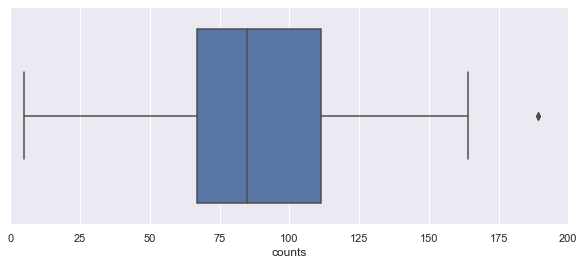

In [48]:
#We want to inspect the graph first
plt.figure(figsize=(10,4))
plt.xlim(0, 200)
sb.boxplot(x=month_counts.counts)

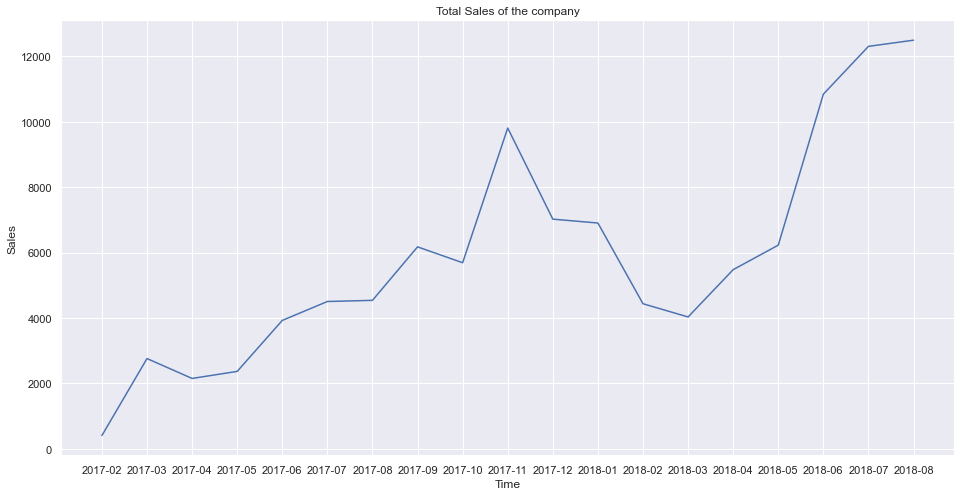

In [49]:
ts=ExSeller.groupby(["month"])["price"].sum()
ts.astype('float')
plt.figure(figsize=(16,8))
plt.title('Total Sales of the company')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.plot(ts);

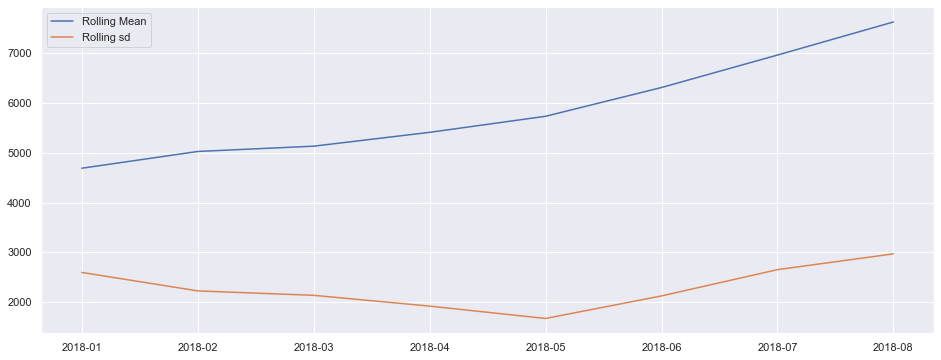

In [50]:
plt.figure(figsize=(16,6))
plt.plot(ts.rolling(window=12,center=False).mean(),label='Rolling Mean');
plt.plot(ts.rolling(window=12,center=False).std(),label='Rolling sd');
plt.legend()

From the above analysis, we can see that the company's order is on a growing trend, however, it also display a vary that depends on season.

###### 2.4.2.2.2.1 Predictitng future sales for single seller
First, we try predicting future sales using linear regression model.\
Since month data is too small a set, we use daily sales to predict.

In [51]:
day=ExSeller.groupby(["day"])["price"].sum().reset_index(name='sales')
day_counts=ExSeller.groupby(['day']).size().reset_index(name='number of orders')
print(type(day))
day_data=pd.merge(day, day_counts, on='day')

day_data.reset_index(inplace=True)
day_data=day_data.rename(columns = {'index':'date num block'})
display(day_data)
day_data.info()

<class 'pandas.core.frame.DataFrame'>


,date num block,day,sales,number of orders
0,0,2017-02-17,199.0,1
1,1,2017-02-24,108.0,2
2,2,2017-02-27,69.0,1
3,3,2017-02-28,29.0,1
4,4,2017-03-01,35.0,1
...,...,...,...,...
487,487,2018-08-24,497.0,7
488,488,2018-08-25,298.0,2
489,489,2018-08-27,49.0,1
490,490,2018-08-28,200.0,3


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 492 entries, 0 to 491
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   date num block    492 non-null    int64  
 1   day               492 non-null    object 
 2   sales             492 non-null    float64
 3   number of orders  492 non-null    int64  
dtypes: float64(1), int64(2), object(1)
memory usage: 15.5+ KB


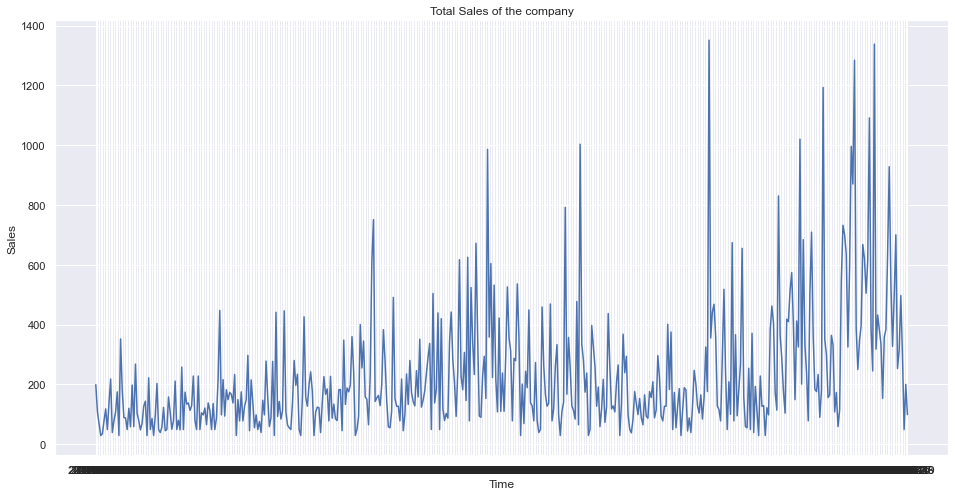

In [52]:
tsa=ExSeller.groupby(["day"])["price"].sum()
tsa.astype('float')
plt.figure(figsize=(16,8))
plt.title('Total Sales of the company')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.plot(tsa);

###### Using Linear Regression Model

In [53]:
from sklearn.linear_model import LinearRegression
linreg = LinearRegression()
y = pd.DataFrame(day_data['sales'])
X = pd.DataFrame(day_data['date num block'])

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 100)

# Check the sample sizes
print("Train Set :", X_train.shape, y_train.shape)
print("Test Set  :", X_test.shape, y_test.shape)

Train Set : (392, 1) (392, 1)
Test Set  : (100, 1) (100, 1)


In [54]:
linreg.fit(X_train, y_train)

LinearRegression()

In [55]:
print('Intercept \t: b = ', linreg.intercept_)
print('Coefficients \t: a = ', linreg.coef_)

Intercept 	: b =  [93.09829426]
Coefficients 	: a =  [[0.53275495]]


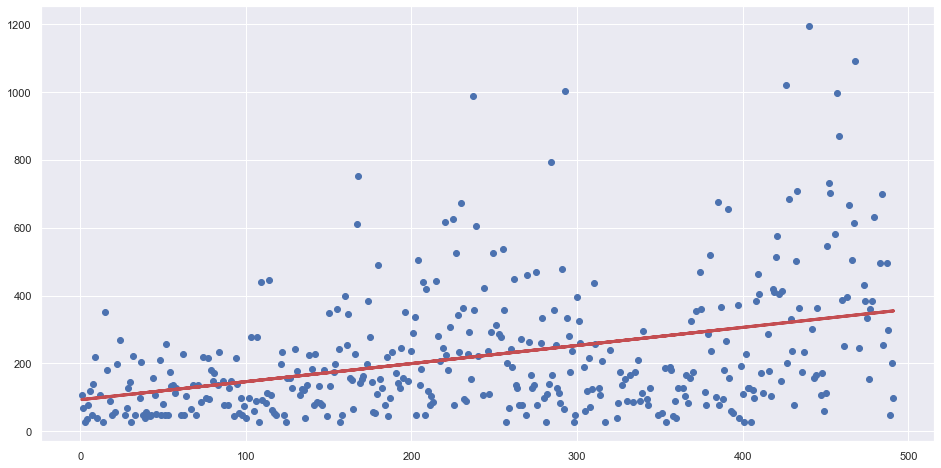

In [56]:
# Formula for the Regression line
regline_x = X_train
regline_y = linreg.intercept_ + linreg.coef_ * X_train

# Plot the Linear Regression line
f, axes = plt.subplots(1, 1, figsize=(16, 8))
plt.scatter(X_train, y_train)
plt.plot(regline_x, regline_y, 'r-', linewidth = 3)
plt.show()

Now we can move on to check the goodness of fit of the linear regression model

In [57]:
# Explained Variance in simply the "Score"
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))

Explained Variance (R^2) 	: 0.14719671724122696


In [58]:
# Import the required metric from sklearn
from sklearn.metrics import mean_squared_error

# Predict the response on the train set
y_train_pred = linreg.predict(X_train)

# Compute MSE on the train set
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))

Mean Squared Error (MSE) 	: 31967.384540275878


From the graph and MSE, R^2 analysis, explained variance is too big for a good model, we can see that linear regression is not a very good model for future sales prediction on month.

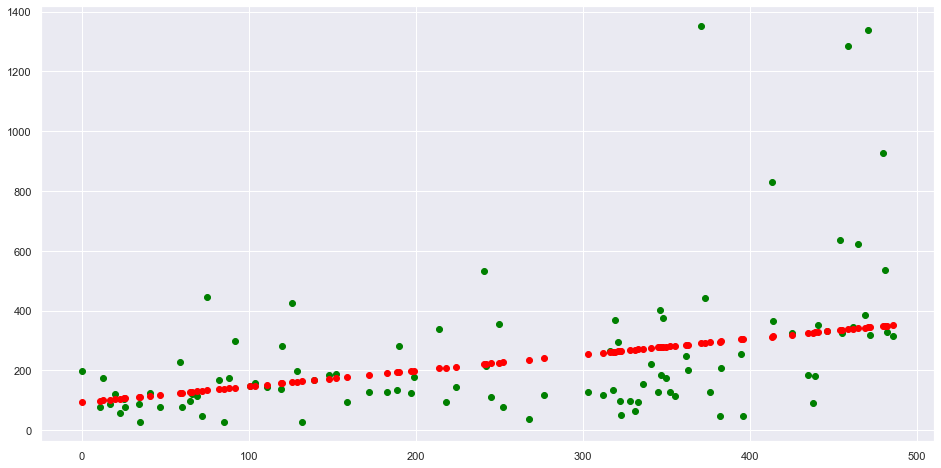

Mean Squared Error (MSE) 	: 50532.08916078206


In [59]:
#Now we can predict sales based on date num block
y_test_pred = linreg.predict(X_test)
f = plt.figure(figsize=(16, 8))
plt.scatter(X_test, y_test, color = "green")
plt.scatter(X_test, y_test_pred, color = "red")
plt.show()
# Compute MSE on the test set
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))

We can see that the explained variance is quite small, especially far below 50%.\
So we try to use a new model.

#### 2. Polynomial fitting



The model for polynomial fitting in  2  degree:


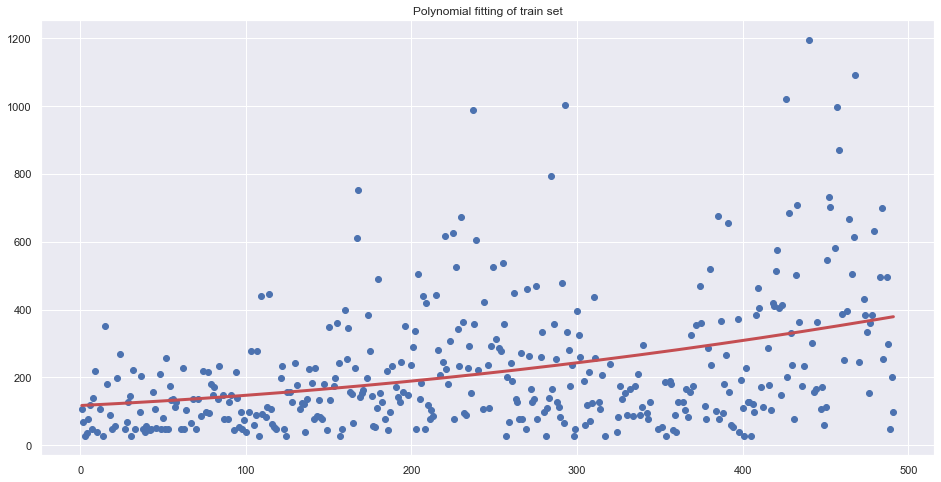

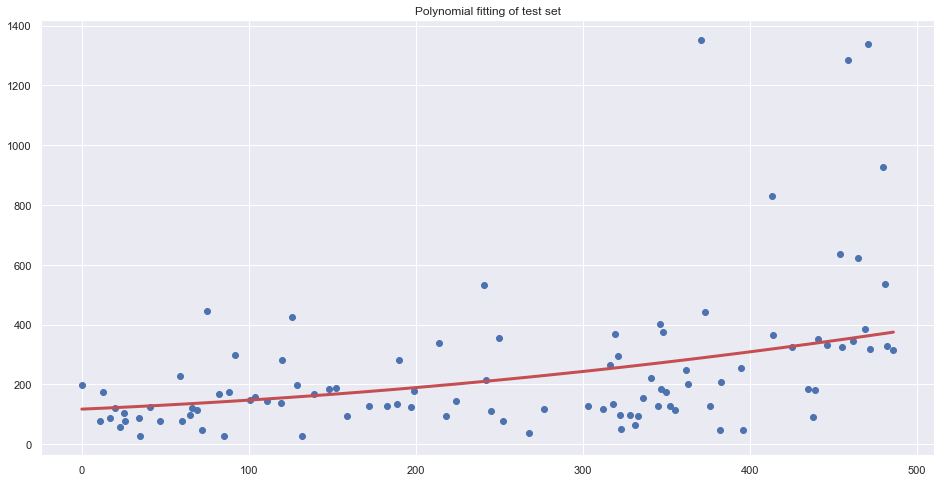

The model performance for the training set
-------------------------------------------
RMSE of training set is 178.47890360593902
R2 score of training set is 0.1502023280026542


The model performance for the test set
-------------------------------------------
RMSE of test set is 221.87825100186836
R2 score of test set is 0.20541329401675756


The model for polynomial fitting in  3  degree:


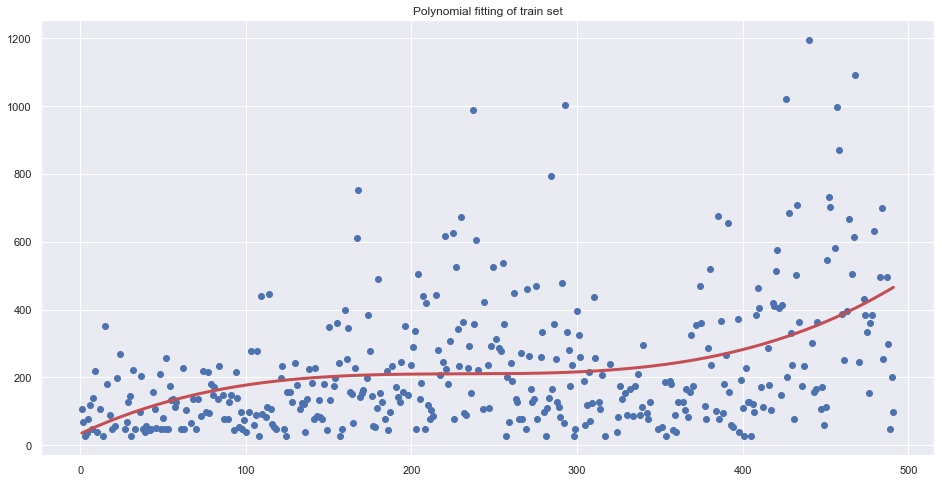

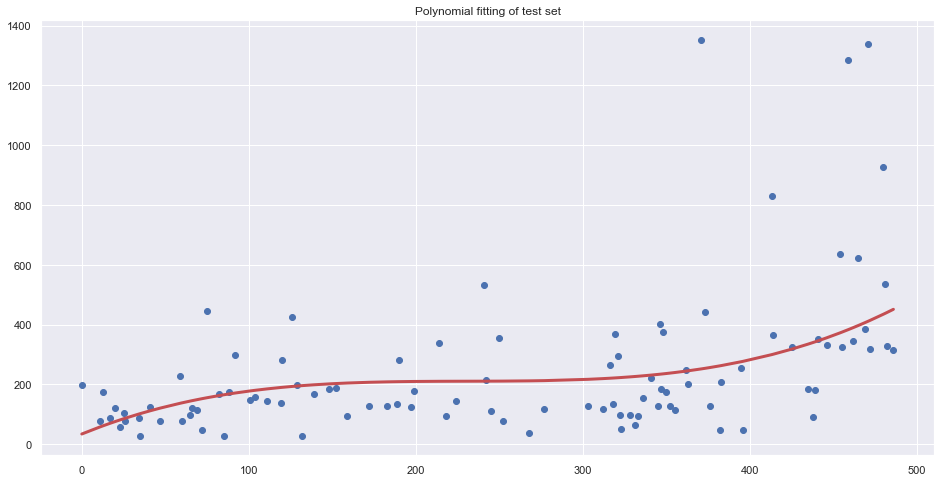

The model performance for the training set
-------------------------------------------
RMSE of training set is 175.68072410397735
R2 score of training set is 0.1766395843075781


The model performance for the test set
-------------------------------------------
RMSE of test set is 216.15074820047113
R2 score of test set is 0.24590629842802814


The model for polynomial fitting in  4  degree:


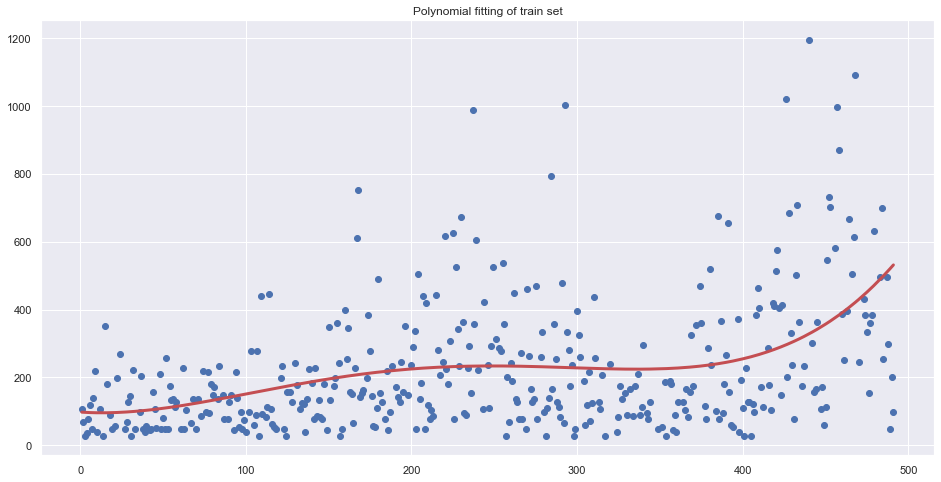

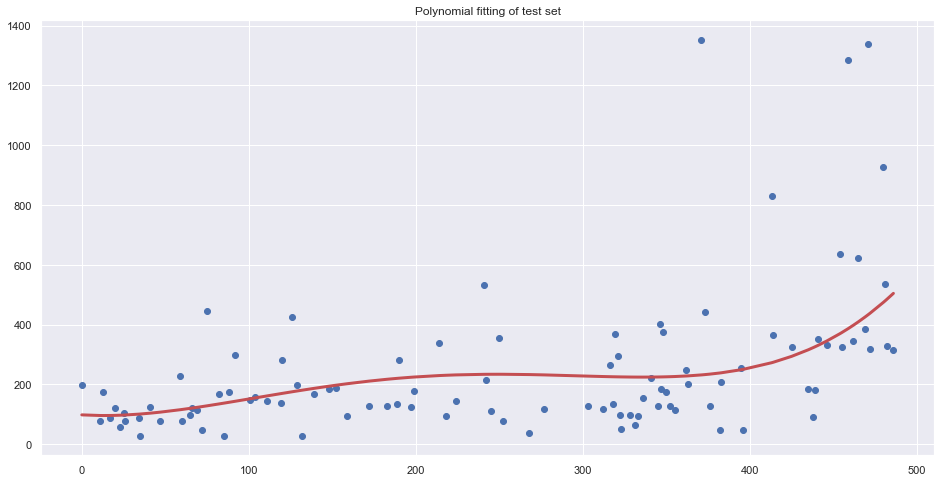

The model performance for the training set
-------------------------------------------
RMSE of training set is 174.32932461149392
R2 score of training set is 0.18925803464224533


The model performance for the test set
-------------------------------------------
RMSE of test set is 215.73482884915427
R2 score of test set is 0.24880557505938983


The model for polynomial fitting in  5  degree:


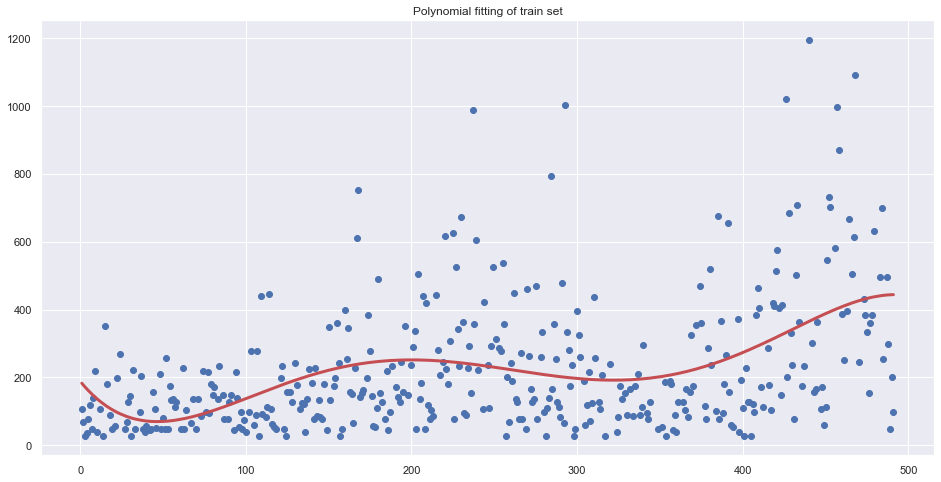

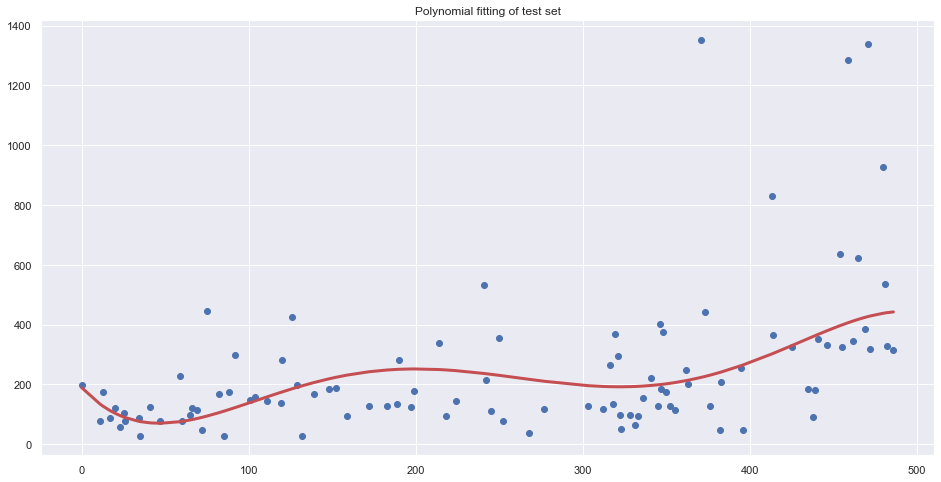

The model performance for the training set
-------------------------------------------
RMSE of training set is 172.06240722315917
R2 score of training set is 0.21020615058858994


The model performance for the test set
-------------------------------------------
RMSE of test set is 216.14946439330853
R2 score of test set is 0.24591525613951792


In [60]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score

X_train_p=X_train.sort_values(['date num block'])
y_train_p=y_train.sort_index()
X_test_p=X_test.sort_values(['date num block'])
y_test_p=y_test.sort_index()

def create_polynomial_regression_model(degree):
    
    #Creates a polynomial regression model for the given degree"
  
    poly_features = PolynomialFeatures(degree=degree)
  
    # transforms the existing features to higher degree features.
    X_train_poly = poly_features.fit_transform(X_train_p)
  
    # fit the transformed features to Linear Regression
    poly_model = LinearRegression()
    poly_model.fit(X_train_poly, y_train_p)
  
    # predicting on training data-set
    y_train_predicted = poly_model.predict(X_train_poly)
    
    f=plt.figure(figsize=(16,8))
    plt.title('Polynomial fitting of train set')
    plt.scatter(X_train_p, y_train_p)
    plt.plot(X_train_p, y_train_predicted, 'r-', linewidth = 3)
    plt.show()
  
    # predicting on test data-set
    y_test_predict = poly_model.predict(poly_features.fit_transform(X_test_p))
  
    # evaluating the model on training dataset
    rmse_train = np.sqrt(mean_squared_error(y_train_p, y_train_predicted))
    r2_train = r2_score(y_train_p, y_train_predicted)
    
    f=plt.figure(figsize=(16,8))
    plt.title('Polynomial fitting of test set')
    plt.scatter(X_test_p, y_test_p)
    plt.plot(X_test_p, y_test_predict, 'r-', linewidth = 3)
    plt.show()
  
    # evaluating the model on test dataset
    rmse_test = np.sqrt(mean_squared_error(y_test_p, y_test_predict))
    r2_test = r2_score(y_test_p, y_test_predict)
  
    print("The model performance for the training set")
    print("-------------------------------------------")
    print("RMSE of training set is {}".format(rmse_train))
    print("R2 score of training set is {}".format(r2_train))
  
    print("\n")
  
    print("The model performance for the test set")
    print("-------------------------------------------")
    print("RMSE of test set is {}".format(rmse_test))
    print("R2 score of test set is {}".format(r2_test))
    

for i in range(2, 6):
    print("\n\nThe model for polynomial fitting in ", i, " degree:")
    create_polynomial_regression_model(i);



From the above fitting and plotting, we can see that though the R2 value has inproved with increase of degree, but the value is still relatively low.\
Perhaps we can learn more advanced models to predict sales in future studies.

## 2.5 What kind of product is most likely to be in closed deals?
- Find out products to avoid


In [61]:
bizSegement=closed['business_segment']
bizSegement.describe()

count            841
unique            33
top       home_decor
freq             105
Name: business_segment, dtype: object

From function describe, we can get a general idea of data composition.
We can see that there are 33 unique category types, and home decoration is the one that mostly likely to appear in a closed order.

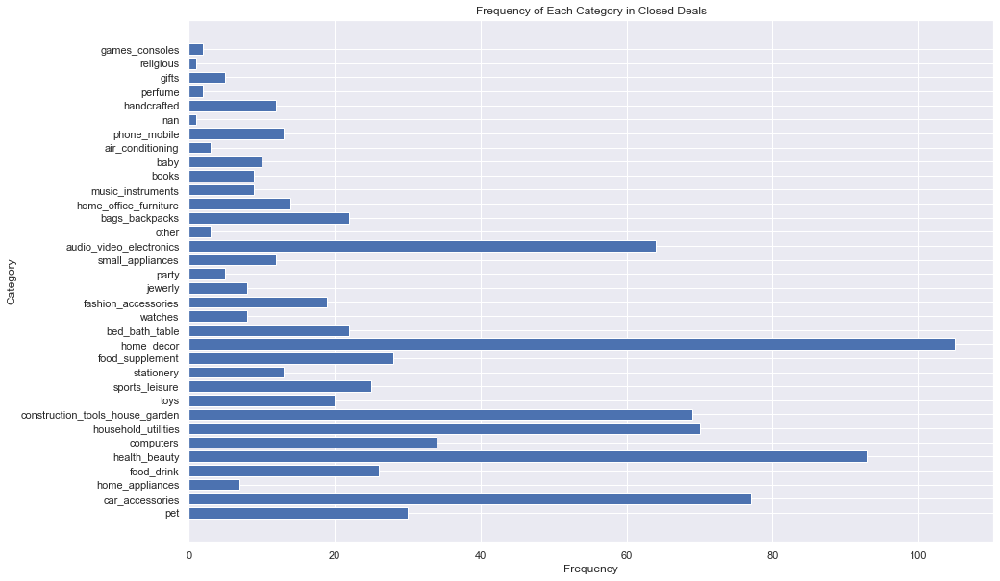

,Frequency,Percentage(100%)
home_decor,105,12.485137
health_beauty,93,11.058264
car_accessories,77,9.155767
household_utilities,70,8.323424
construction_tools_house_garden,69,8.204518
audio_video_electronics,64,7.609988
computers,34,4.042806
pet,30,3.567182
food_supplement,28,3.329370
food_drink,26,3.091558


In [62]:
#plot the histogram to see the distribution of product type
#convert object data type to string
segement=[]
count_seg=bizSegement.count()
for i in range(count_seg):
    segement.append(bizSegement.head(count_seg).values[i])

#create dictionary to hold the frequency of each category
freq={}
for i in segement:
    try:
        freq[i]+=1
    except:
        freq[i]=1

#Firstly plot the horizontal barplot for data visualizaion
cat=np.array(list(freq.keys()))
fre=list(freq.values())
f=plt.figure(figsize=(15, 10))
plt.barh(cat,fre)
plt.title('Frequency of Each Category in Closed Deals')
plt.ylabel('Category')
plt.xlabel('Frequency')
plt.show()

#Secondly display frequency for clearer data interpretation
freq=pd.DataFrame.from_dict(freq, orient='index',columns=['Frequency'])
freq['Percentage(100%)'] =(freq['Frequency']/freq['Frequency'].sum()*100)

freq=freq.sort_values("Frequency", ascending=False)
display(freq)

From the above dataframe representation, we can see that `home_decor`, `health_beauty`, `car_accessories`, `household_utilities`, `construction_tools_house_garden`, and `audio_video_electronics` are the categorys that most likely to have regretted customers.

These catogories have a large gap with the next category `computers`, with a jump from 64 to 34.



### Sellers should be aware of the risks before joining these areas.

# 3.Geolocation Analysis

## 3.1 Needed files for geolocation analysis:
**File 2: olist_customers_dataset.csv**

**File 3: olist_geolocation_dataset.csv**

**File 11: olist_sellers_dataset.csv**

**Additional: South_America.geo.json**


In [63]:
#File 2
customers=pd.read_csv("olist_customers_dataset.csv")
#File 3
locations=pd.read_csv("olist_geolocation_dataset.csv")

#Since we only have zip code data for seller location, we can drop duplicated values for zip code.
locations=locations.drop_duplicates('geolocation_zip_code_prefix')
display(locations)

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP
5,1012,-23.547762,-46.635361,são paulo,SP
...,...,...,...,...,...
999774,99955,-28.107588,-52.144019,vila langaro,RS
999780,99970,-28.345143,-51.876926,ciriaco,RS
999786,99910,-27.863500,-52.084760,floriano peixoto,RS
999803,99920,-27.858716,-52.300403,erebango,RS


## 3.2 Where are the best sellers located?

In [64]:
best_seller_loc=sellers.loc[sellers['seller_id']==best_sellers_id[0]]
for i in range(1,10):
  best_seller_loc=best_seller_loc.append(sellers.loc[sellers['seller_id']==best_sellers_id[i]])
display(best_seller_loc)

,seller_id,seller_zip_code_prefix,seller_city,seller_state
797,6560211a19b47992c3666cc44a7e94c0,5849,sao paulo,SP
2463,4a3ca9315b744ce9f8e9374361493884,14940,ibitinga,SP
1413,cc419e0650a3c5ba77189a1882b7556a,9015,santo andre,SP
474,1f50f920176fa81dab994f9023523100,15025,sao jose do rio preto,SP
1873,da8622b14eb17ae2831f4ac5b9dab84a,13405,piracicaba,SP
390,955fee9216a65b617aa5c0531780ce60,4782,sao paulo,SP
2207,7a67c85e85bb2ce8582c35f2203ad736,3426,sao paulo,SP
987,ea8482cd71df3c1969d7b9473ff13abc,4160,sao paulo,SP
2617,4869f7a5dfa277a7dca6462dcf3b52b2,14840,guariba,SP
2345,3d871de0142ce09b7081e2b9d1733cb1,13232,campo limpo paulista,SP


We can see that all the best sellers locate in State SP(Sau Paulo), and in different cities of the state.

In [65]:
SP_wiki=pd.read_html('https://en.wikipedia.org/wiki/S%C3%A3o_Paulo_(state)')
print("HTML tables : ", len(SP_wiki))
display(SP_wiki[0].iloc[8:42,])

HTML tables :  21


,São Paulo,São Paulo.1
8,Country,Brazil
9,Named for,Paul the Apostle
10,Capital,São Paulo
11,Government,Government
12,• Body,Legislative Assembly
13,• Governor,João Doria (PSDB)
14,• Vice Governor,Rodrigo Garcia (DEM)
15,• Senators,José Serra (PSDB)Sérgio Olímpio (PSL)Mara Gabr...
16,Area,Area
17,• Total,"248,222.8 km2 (95,839.4 sq mi)"


Above are some information about Sau Paolo we extracted from wikipedia.

## 3.3 Where are the sellers located in general?

In [66]:
zip_code=sellers['seller_zip_code_prefix']
seller_loc=locations.loc[locations['geolocation_zip_code_prefix']==zip_code[0]]
for index,value in zip_code.items():
  seller_loc=seller_loc.append(locations.loc[locations['geolocation_zip_code_prefix']==value])
display(seller_loc)

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
285371,13023,-22.898536,-47.063125,campinas,SP
285371,13023,-22.898536,-47.063125,campinas,SP
319698,13844,-22.382941,-46.946641,mogi-guacu,SP
404282,20031,-22.910641,-43.176510,rio de janeiro,RJ
76023,4195,-23.657250,-46.610759,sao paulo,SP
...,...,...,...,...,...
895005,87111,-23.456431,-51.866369,sarandi,PR
905068,88137,-27.623801,-48.674286,palhoça,SC
97545,4650,-23.659845,-46.677882,sao paulo,SP
975543,96080,-31.744231,-52.328761,pelotas,RS


With the data of seller locations, now we want to draw the map for seller geolocation distribution.

In [67]:
import folium
import json
from folium import plugins

with open('South_America.geo.json') as f:
    Area = json.load(f)

In [68]:
#initialize the map around South America County
map = folium.Map([-19.623237, -57.970215], zoom_start=5,)
#add the shape of South America Continent Shape to the map
folium.GeoJson(Area).add_to(map)

#for each row in the Starbucks dataset, plot the corresponding latitude and longitude on the map
for i,row in seller_loc.iterrows():
  folium.CircleMarker((row.geolocation_lat,row.geolocation_lng), radius=3, weight=2, color='red', fill_color='red', fill_opacity=.5).add_to(map)

map

In [69]:
# We can also plot the heatmap for seller geolocation
map.add_child(plugins.HeatMap(data=seller_loc[['geolocation_lat','geolocation_lng']].values, radius=25, blur=10))

map

In the regions shown red in heatmap, sellers are concentrated, which means these areas may have better logistic and inventory conditions or services. It is wise to locate in these regions as a seller who wants to do well.